In [28]:
import spacy
import numpy as np
import pandas as pd
import re
from collections import Counter
import seaborn as sns
from wordcloud import WordCloud

import matplotlib.pyplot as plt 
%matplotlib inline

import mplcursors

# from os import path
# from PIL import Image


nlp = spacy.load('en_core_web_sm')

In [ ]:
spacy_stopwords = spacy.lang.en.stop_words.STOP_WORDS

In [ ]:
df = pd.read_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\divya_youtube.csv", encoding = 'latin-1')
df.head()

In [ ]:
df.shape

In [ ]:
#To replace nan values with dot
for i in df.columns:
    df[i] = df[i].replace(np.nan, ".")

In [2]:
def cleaner(df1):
    "Extract relevant text from DataFrame using a regex"
    # Regex pattern for only alphanumeric, hyphenated text with 3 or more chars
    pattern = re.compile(r"[A-Za-z\-]{3,50}")
    df1['Title'] = df1['Title'].str.findall(pattern).str.join(' ')
    df1['Description'] = df1['Description'].str.findall(pattern).str.join(' ')
    df1['Tags'] = df1['Tags'].str.findall(pattern).str.join(' ')
    #Removing numbers
#     df1['Title'] = df1['Title'].str.replace('\d+', '')
#     df1['Description'] = df1['Description'].str.replace('\d+', '')
#     df1['Tags'] = df1['Tags'].str.replace('\d+', '')
#     df1['Description'] = df1['Description'].str.replace('http\S+|www.\S+|html\S+|-\S+|com\S+|youtube\S+|https\S+','', case=False)
#     df1['Tags'] = df1['Tags'].str.replace('http\S+|www.\S+|html\S+|-\S+|com\S+|youtube\S+|https\S+','', case=False)
    return df1
      


In [ ]:
df_preproc = cleaner(df)

In [ ]:
df_preproc.drop(['Title','Description','Tags'],axis=1,inplace=True)

In [ ]:
df_preproc.to_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Preprocess_data.csv", index=False)

In [ ]:
df_preproc = pd.read_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Preprocess_data.csv")
df_preproc.head()

In [ ]:
nlp_df= pd.DataFrame(columns=["Title_token", "Desc_token", "Tags_token", "Category"])
nlp_df

In [3]:
def is_token_allowed(token):
    '''
        Only allow valid tokens which are not stop words
        and punctuation symbols.
    '''
    if (not token or not token.string.strip() or
        token.is_stop or token.is_punct):
        return False
    return True
    
def preprocess_token(token):
    # Reduce token to its lowercase lemma form
    token = token.lemma_.strip().lower()
#     token = token.replace('http\S+|www.\S+|html\S+|-\S+|com\S+|youtube\S+|https\S+','')#, case=False)
    return token

In [4]:
def get_tokens(main_df,nlp_df):
#     nlp_df= pd.DataFrame(columns=["Title_token", "Desc_token", "Tags", "Category"])
    for i in main_df.index:
        a = {}
        row = main_df.iloc[i,].tolist()
#         print(row)
        for j in range(len(row)):
            doc_item = nlp(row[j])
            tokens = [preprocess_token(token) for token in doc_item if is_token_allowed(token)]
#             tokens_nostop = [token for token in tokens if token not in spacy_stopwords]   #No neeeddddd
            a.update({nlp_df.columns[j]:str(tokens).strip("[]")})
#             break
#             print(tokens)
#         print(a)
        nlp_df = nlp_df.append(a, ignore_index=True)
#         break
    return nlp_df


In [ ]:
nlp_df =get_tokens(df_preproc, nlp_df)

In [ ]:
nlp_df.head()

In [ ]:
nlp_df.shape

In [ ]:
nlp_df.Category = df_preproc.Category

In [ ]:
nlp_df.to_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Tokens_data1.csv", index=False)

## Word Freq

In [ ]:
nlp_data = pd.read_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Tokens_data2.csv")
nlp_data.head()

In [ ]:
#To replace nan values with dot
for i in nlp_data.columns:
    nlp_data[i] = nlp_data[i].replace(np.nan, ".")

In [ ]:
#Removing numbers - Added to cleaner() func
nlp_data['Title_token'] = nlp_data['Title_token'].str.replace('\d+', '')
nlp_data['Desc_token'] = nlp_data['Desc_token'].str.replace('\d+', '')
nlp_data['Tags_token'] = nlp_data['Tags_token'].str.replace('\d+', '')

In [ ]:
#Removing links(http,www,com,youtube etc) - Added to cleaner() func
nlp_data['Desc_token'] = nlp_data['Desc_token'].str.replace('http\S+|www.\S+|html\S+|-\S+|com\S+|youtube\S+|https\S+','', case=False)
nlp_data['Tags_token'] = nlp_data['Tags_token'].str.replace('http\S+|www.\S+|html\S+|-\S+|com\S+|youtube\S+|https\S+','', case=False)

In [ ]:
nlp_data.to_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\Tokens.csv", index=False)

In [ ]:
categories = nlp_data.Category.unique()
categories

In [ ]:
def word_counter(text, cat, main_counts):
    freq = pd.Series(' '.join(text).split())
    freq=freq.str.cat(sep=" ")
    docs = nlp(freq)
    tokens = [preprocess_token(token) for token in docs if is_token_allowed(token)]    
    word_counts = Counter(tokens)

    counts_df = pd.DataFrame.from_dict(word_counts, orient="index").reset_index()
    counts_df = counts_df.rename(columns={"index":"Word",0:"Count"}).sort_values(by="Count", ascending=False)
    counts_df["Category"] = cat

    main_counts = main_counts.merge(counts_df, on="Word", how="outer")
    main_counts.fillna(0, inplace=True)
    main_counts["Count"] = main_counts['Count_x'] + main_counts['Count_y']
    main_counts["Category"] = cat
    main_counts.drop(["Count_x", "Count_y", "Category_x", "Category_y"], axis=1, inplace=True)
    return main_counts

#     top5 = word_counts.most_common(5)
#     return counts_df.iloc[:10,]

In [ ]:
title_freq = pd.DataFrame(columns=["Category","Word", "Count"])
for category in categories:
    midman_df = pd.DataFrame(columns=["Category","Word", "Count"])
    df_cat = nlp_data[nlp_data.Category==category] 
#     freq = pd.Series(' '.join(df_cat['Title_token']).split()).value_counts()[:5]
#     print(freq)
    title_freq = title_freq.append(word_counter(df_cat.Title_token, category,midman_df), ignore_index=True)
#     input("Enter any key to continue")

In [ ]:
len(title_freq.Category.unique())

In [ ]:
title_freq.to_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\Title_counts.csv", index=False)

In [ ]:
len(nlp_data[nlp_data.Category=="Music"].Desc_token)

In [ ]:
desc_freq= pd.DataFrame(columns=["Category","Word", "Count"])
for category in categories:
    midman_df = pd.DataFrame(columns=["Category","Word", "Count"])
    df_cat = nlp_data[nlp_data.Category==category]
    for i in range(0,df_cat.shape[0],200):
        if (i+200)<df_cat.shape[0]:l=i+200
        else: l = df_cat.shape[0]+1            
        midman_df = word_counter(df_cat.Desc_token[i:l], category, midman_df)
#         break
    midman_df.sort_values(by='Count', ascending=False, inplace=True)
#     plot_unigram(midman_df[:20], category)
    desc_freq = desc_freq.append(midman_df, ignore_index=True)
#     desc_freq.update({category: word_counter(df_cat.Desc_token)})
#     input("Enter any key to continue")

In [ ]:
len(desc_freq.Category.unique())

In [ ]:
desc_freq.to_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\Desc_counts.csv", index=False)

In [ ]:
tags_freq=pd.DataFrame(columns=["Category","Word", "Count"])

for category in categories:
    midman_df = pd.DataFrame(columns=["Category","Word", "Count"])
    df_cat = nlp_data[nlp_data.Category==category] 
    
    for i in range(0,df_cat.shape[0],200):
        if (i+200)<df_cat.shape[0]:l=i+200
        else: l = df_cat.shape[0]+1            
        midman_df = word_counter(df_cat.Tags_token[i:l], category, midman_df)
#         break
    midman_df.sort_values(by='Count', ascending=False, inplace=True)
#     plot_unigram(midman_df[:20], category)
    tags_freq = tags_freq.append(midman_df, ignore_index=True)

#     tags_freq = tags_freq.append(word_counter(df_cat.Tags_token, category), ignore_index=True)
#     tags_freq.update({category: word_counter(df_cat.Tags_token)})
#     input("Enter any key to continue")

In [ ]:
len(tags_freq.Category.unique())

In [ ]:
tags_freq.to_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\Tags_counts.csv", index=False)

## Unigrams

In [5]:
def plot_unigram(cat_df, title):
    #Barplot of most freq words
    sns.set(rc={'figure.figsize':(13,10)})
    g = sns.barplot(x="Word", y="Count", data=cat_df)
    g.set_xticklabels(g.get_xticklabels(), rotation=45)
    g.set_title(title, fontsize=20)
    mplcursors.cursor(hover=True)
    plt.show()

### Titles

In [6]:
title_freq = pd.read_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\Title_countsNEW.csv")

In [7]:
categories = title_freq.Category.unique()
categories

array(['Music', 'Entertainment', 'Automobiles', 'Education',
       'Film_and_Animation', 'Food', 'News_Politics', 'Fashion', 'Gaming',
       'Videoblogging', 'Travel', 'Sports', 'Sciene&Technology',
       'Religion', 'Pets_Animals'], dtype=object)

In [8]:
title_freq.shape

(47274, 3)

In [9]:
# for cat in categories:
#     print(title_freq[title_freq.Category==cat])

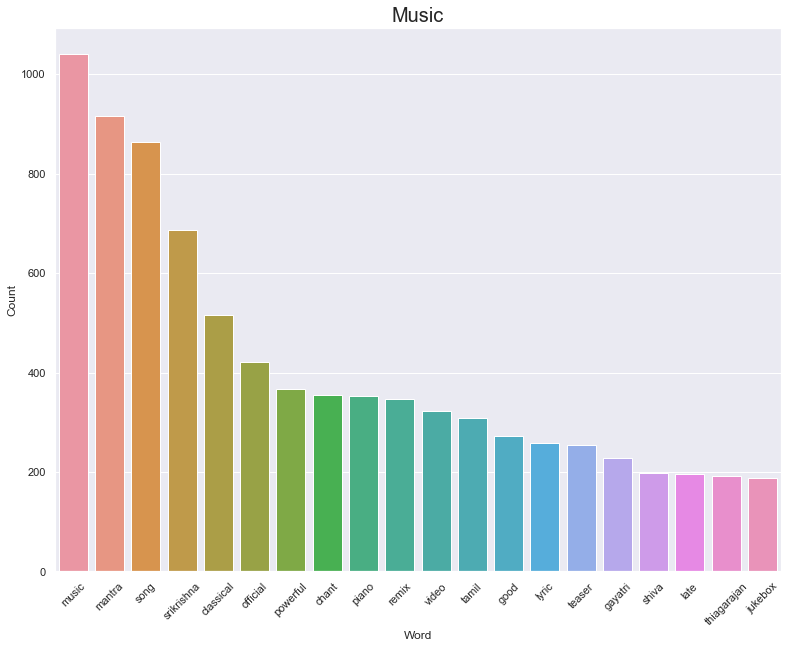

Enter any key to continue


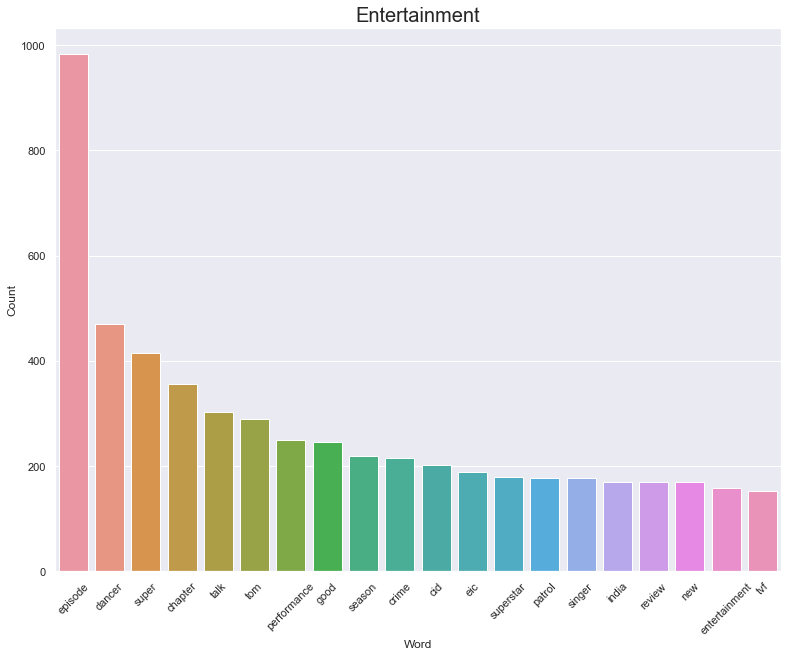

Enter any key to continue


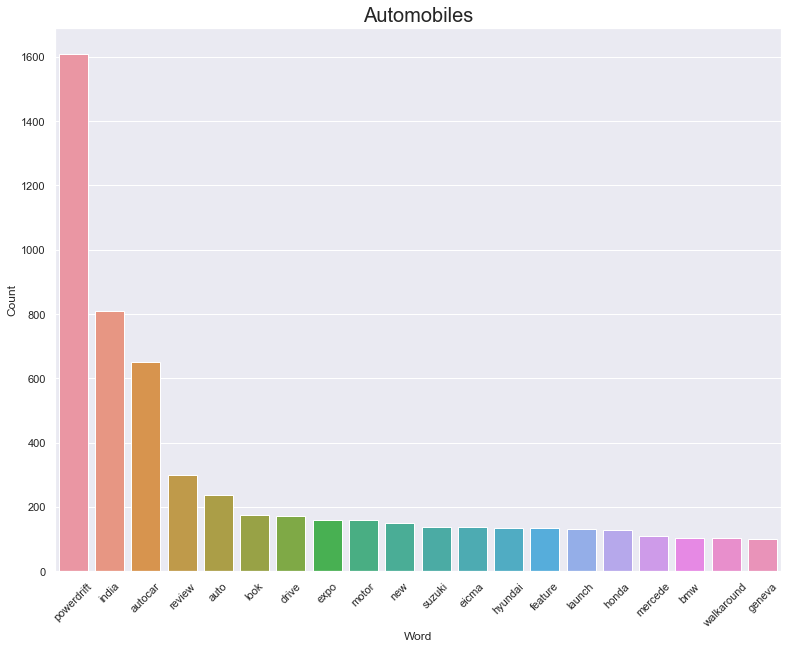

Enter any key to continue


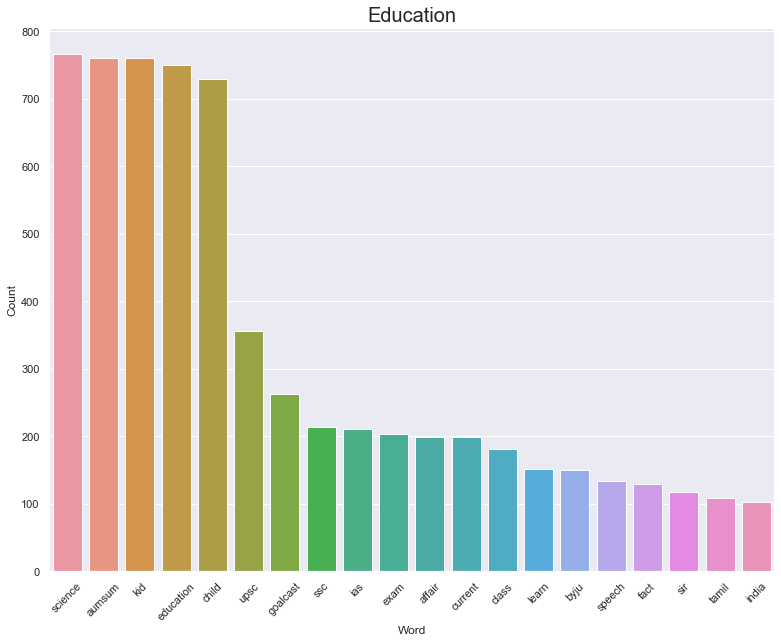

Enter any key to continue


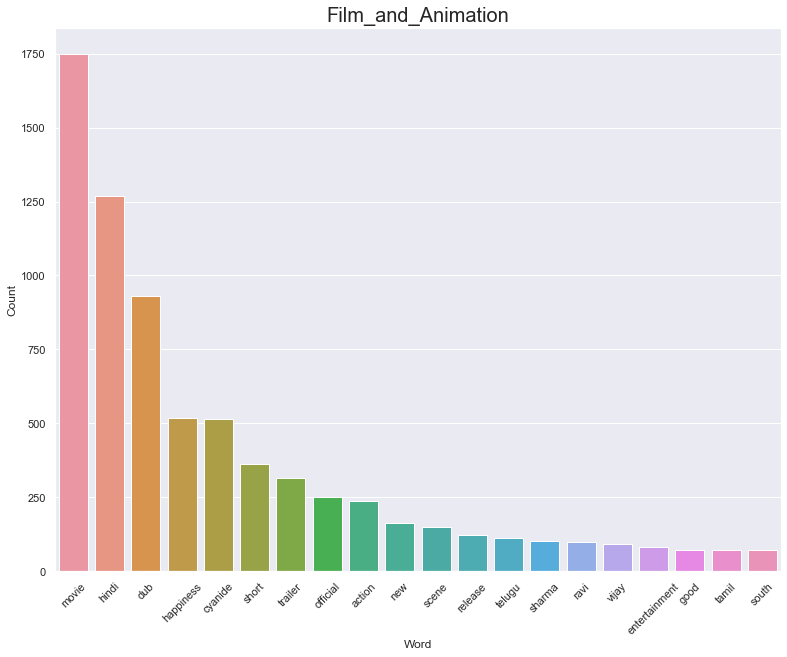

Enter any key to continue


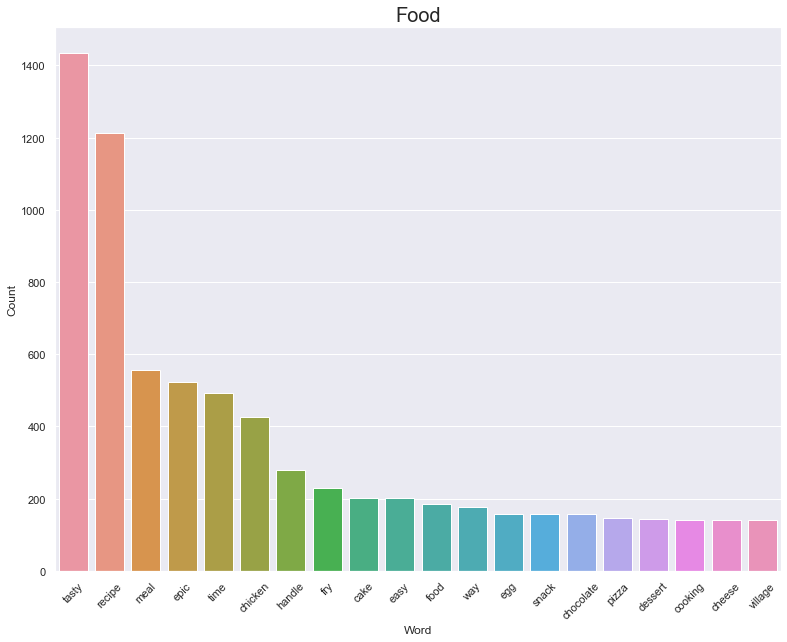

Enter any key to continue


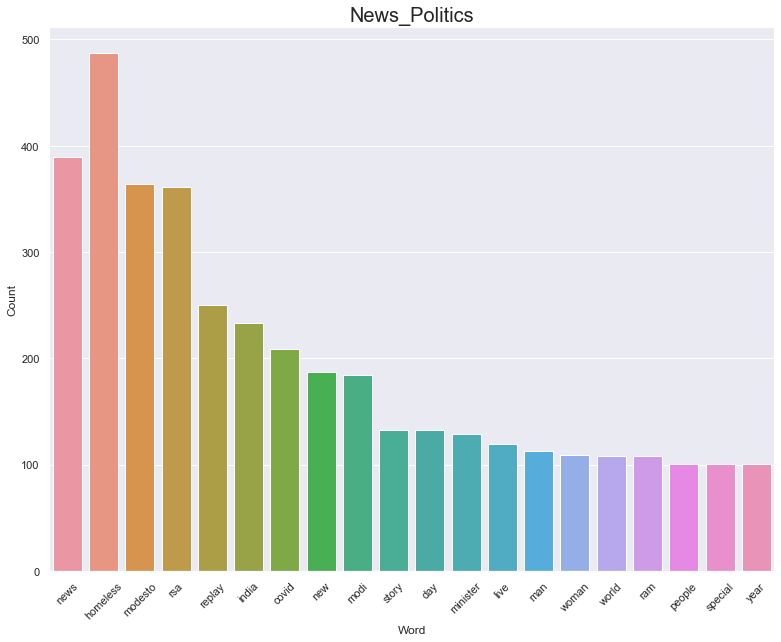

Enter any key to continue


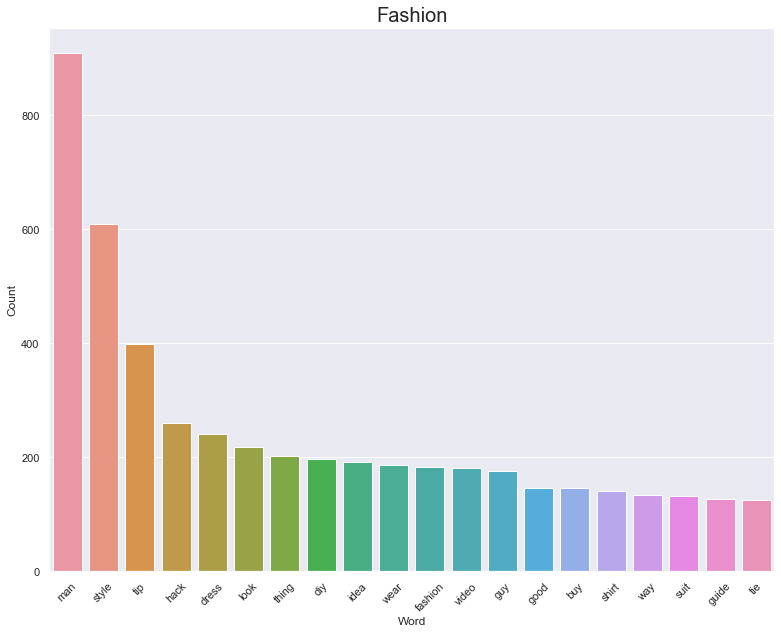

Enter any key to continue


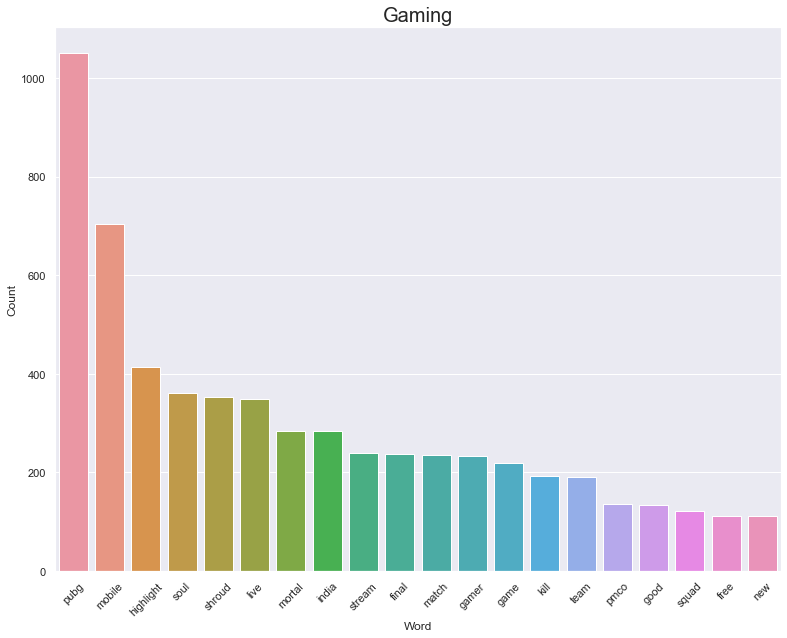

Enter any key to continue


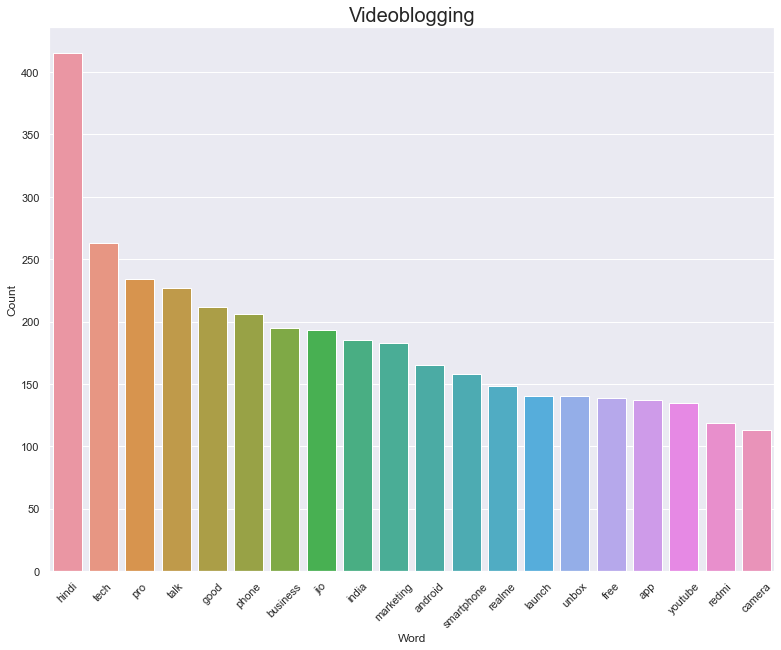

Enter any key to continue


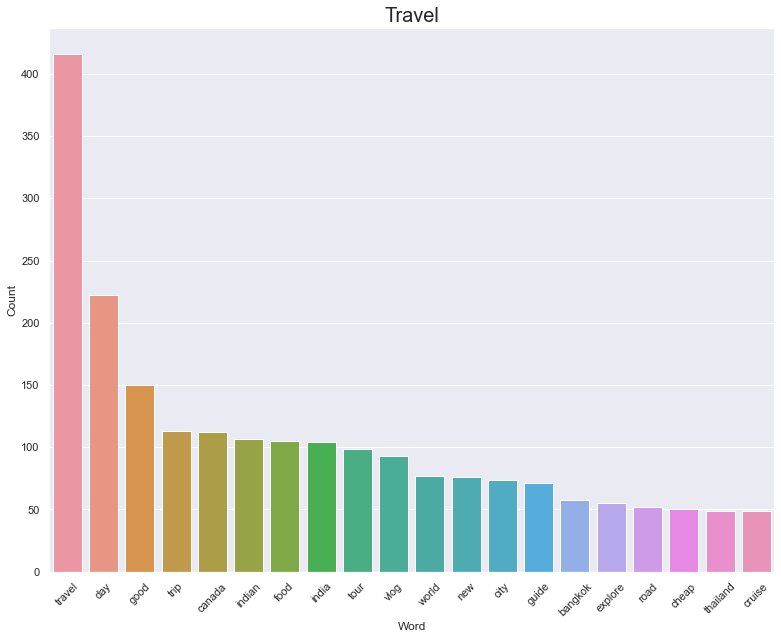

Enter any key to continue


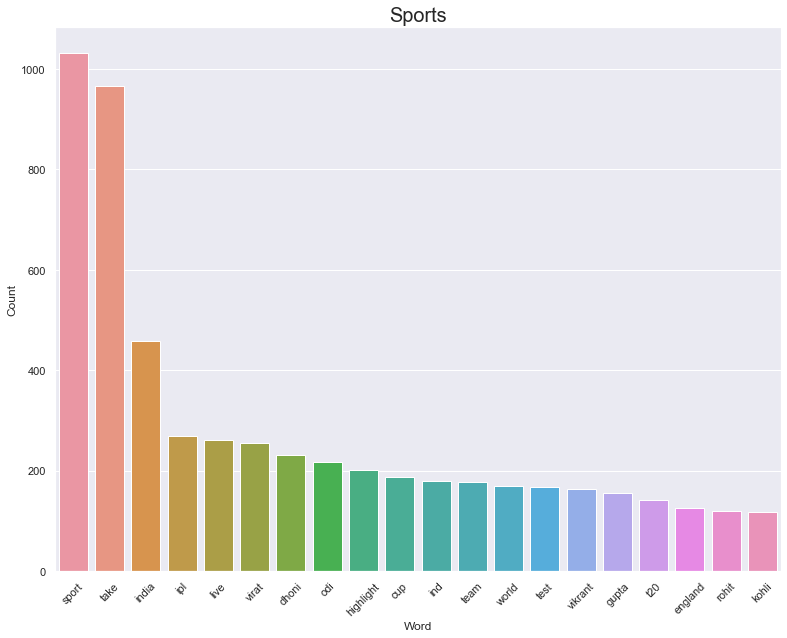

Enter any key to continue


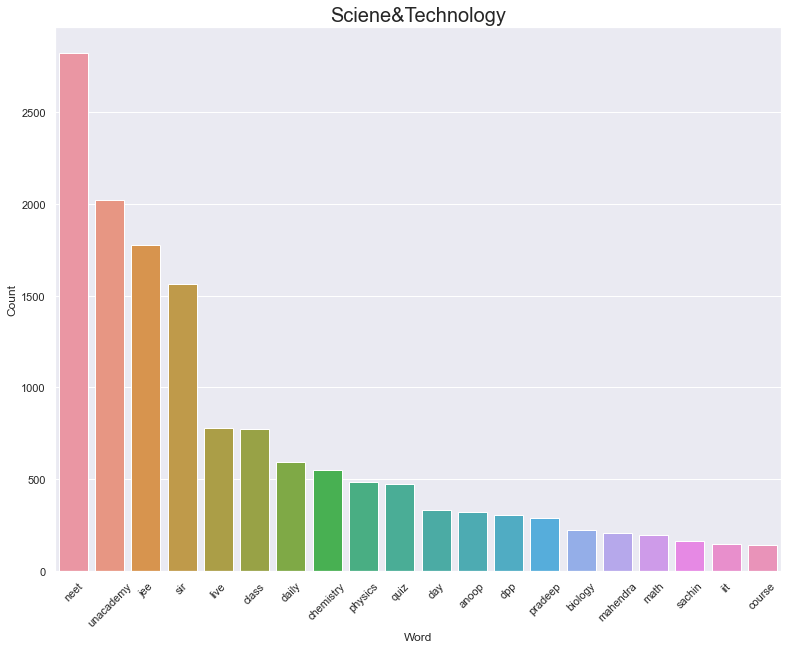

Enter any key to continue


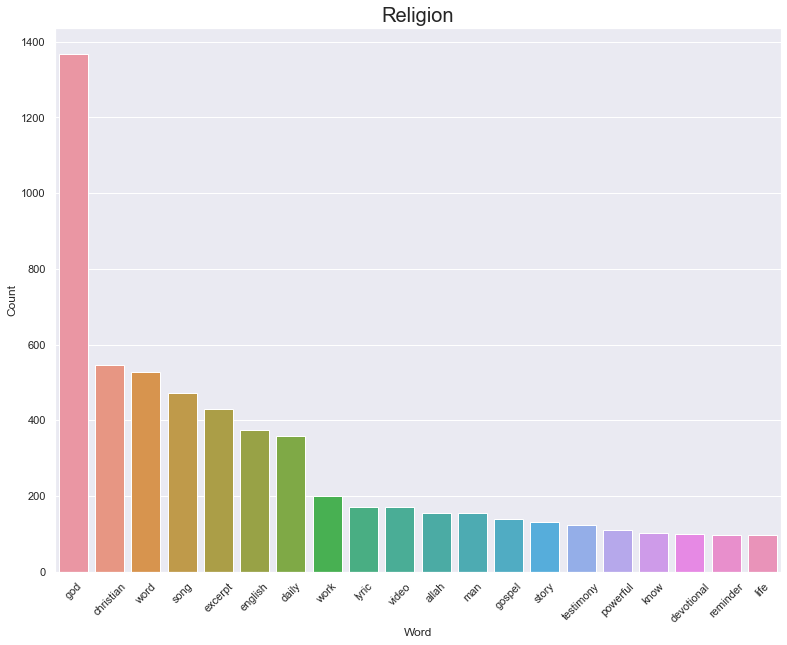

Enter any key to continue


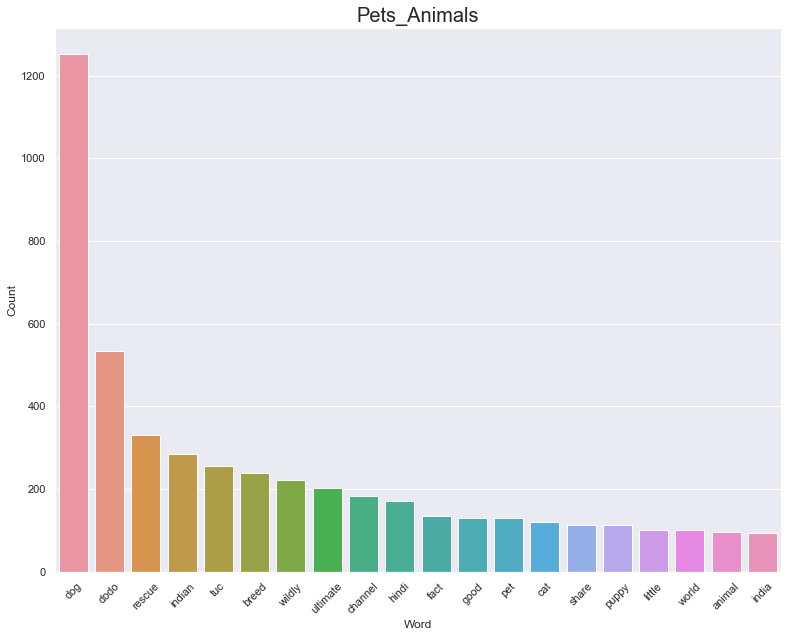

Enter any key to continue


In [10]:
for cat in categories:
    plot_unigram(title_freq[title_freq.Category==cat].iloc[:20], cat)
    input("Enter any key to continue")

### Description

In [11]:
desc_freq = pd.read_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\Desc_countsNEW.csv")

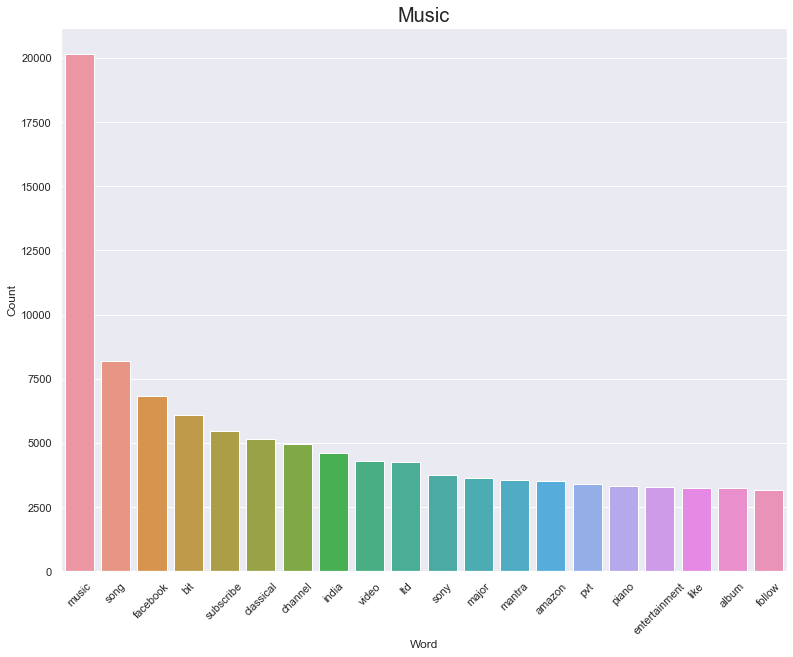

Enter any key to continue


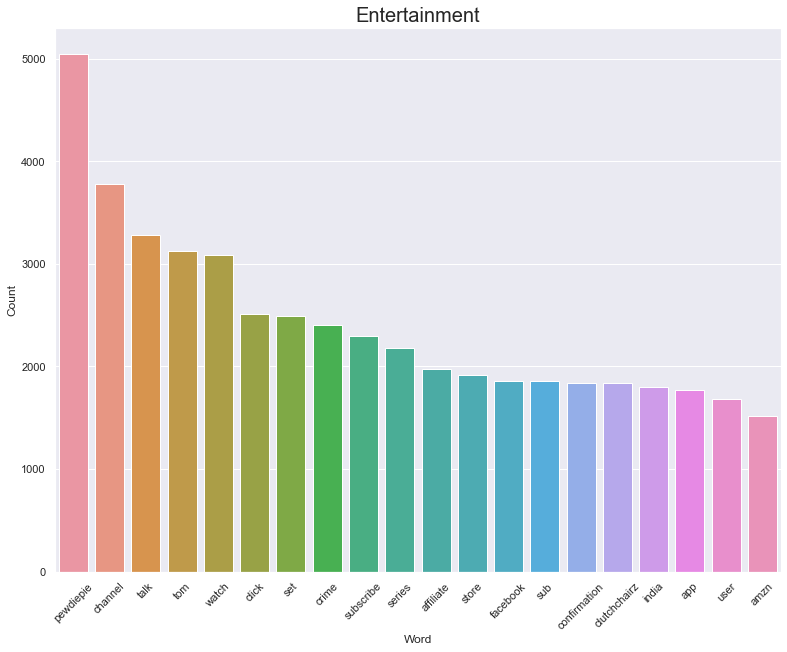

Enter any key to continue


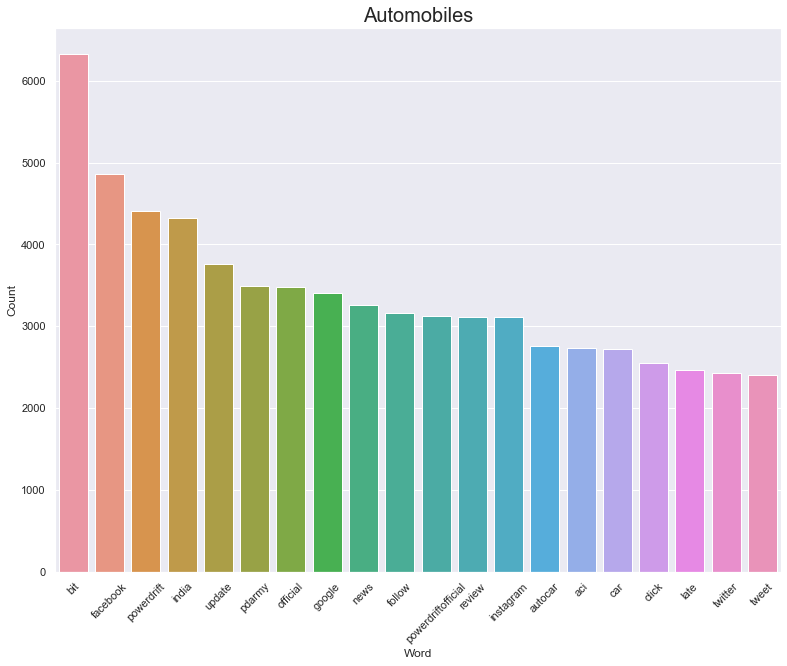

Enter any key to continue


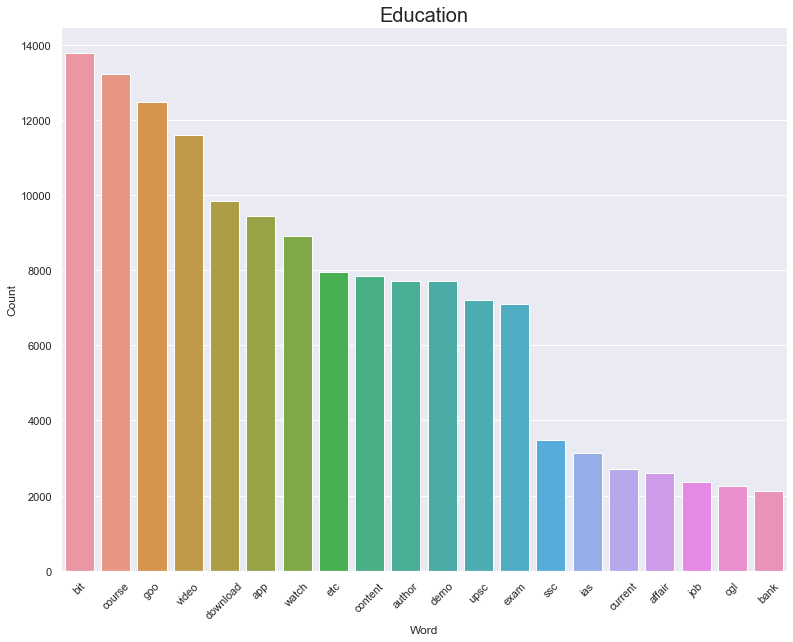

Enter any key to continue


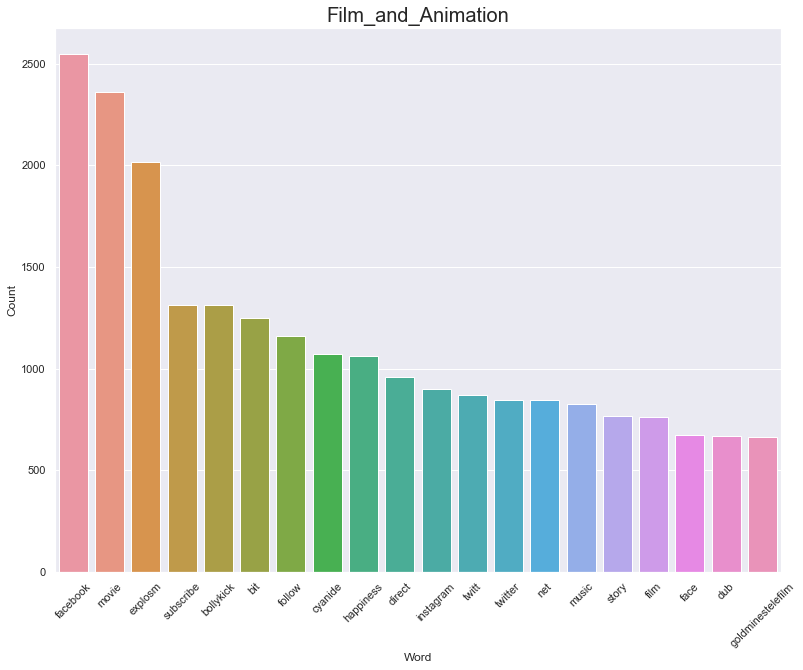

Enter any key to continue


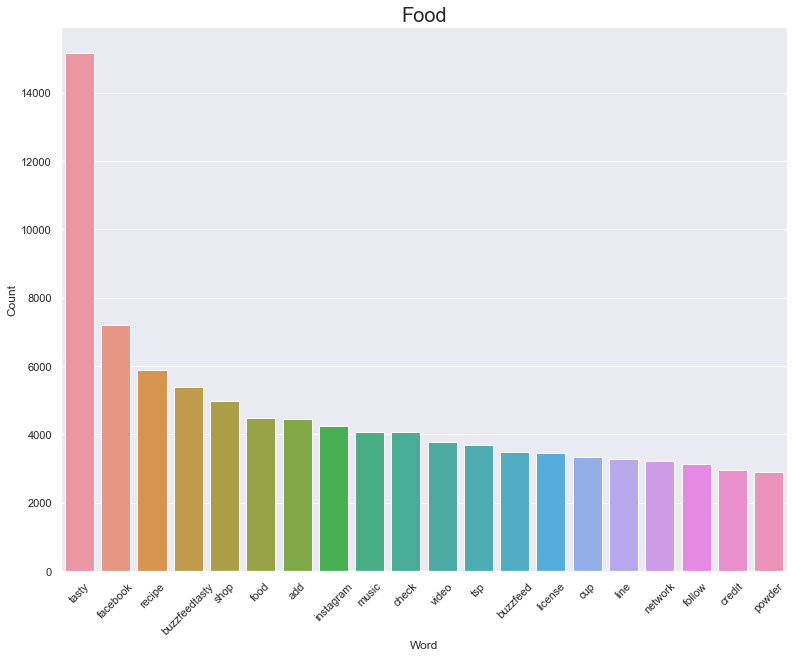

Enter any key to continue


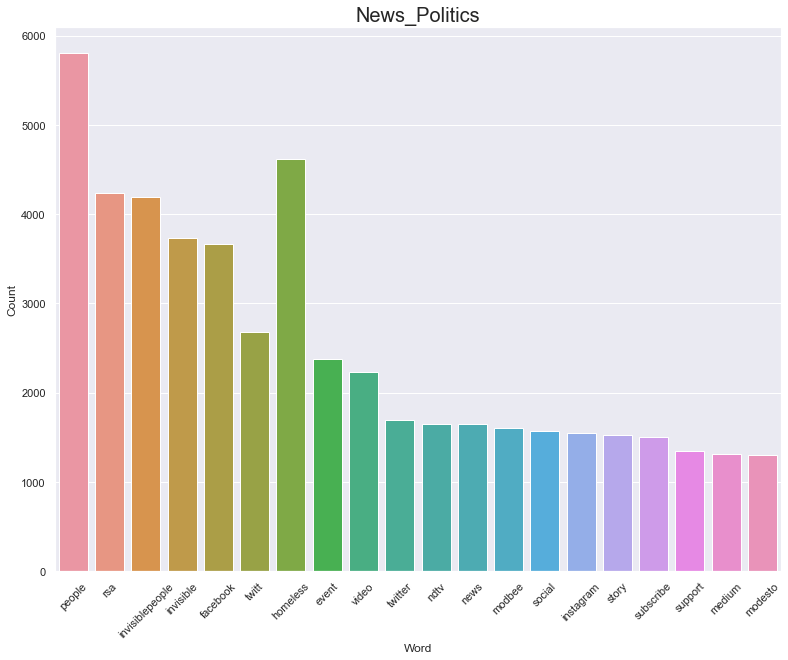

Enter any key to continue


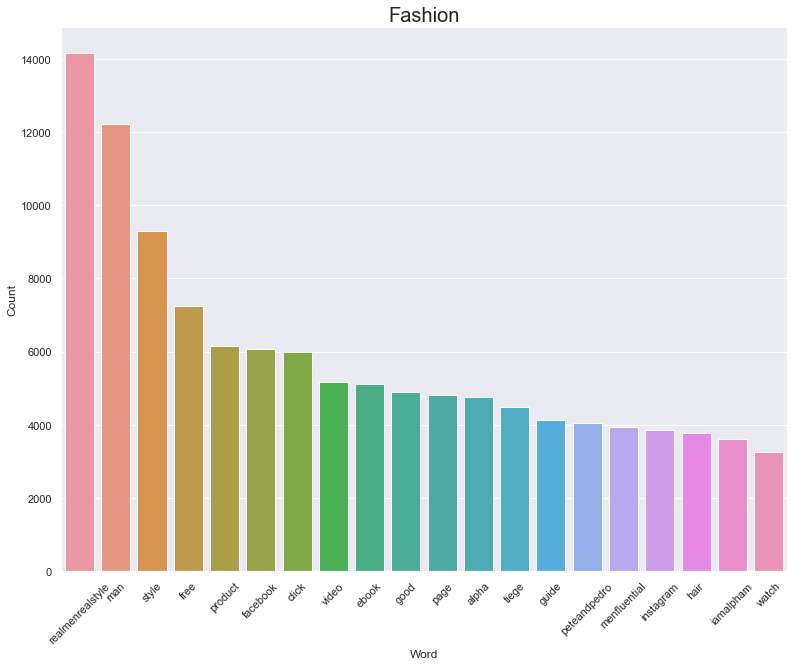

Enter any key to continue


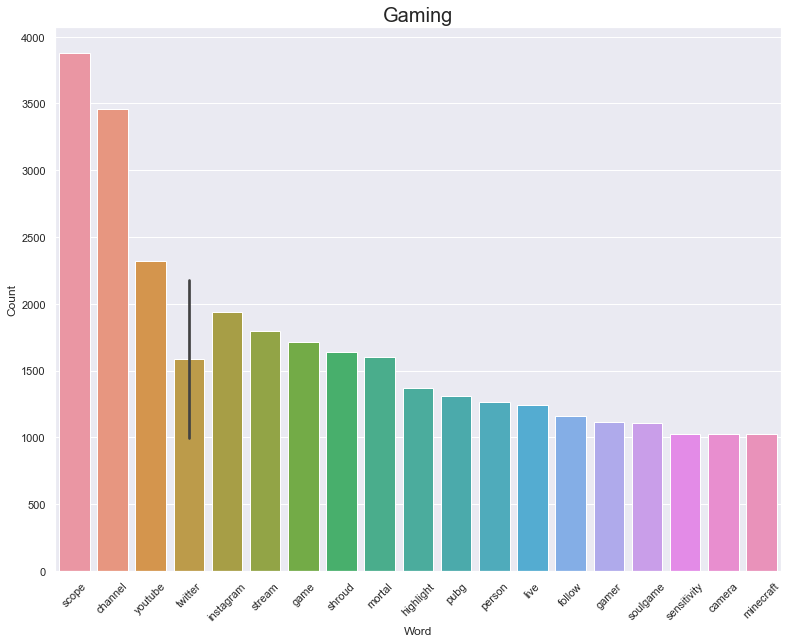

Enter any key to continue


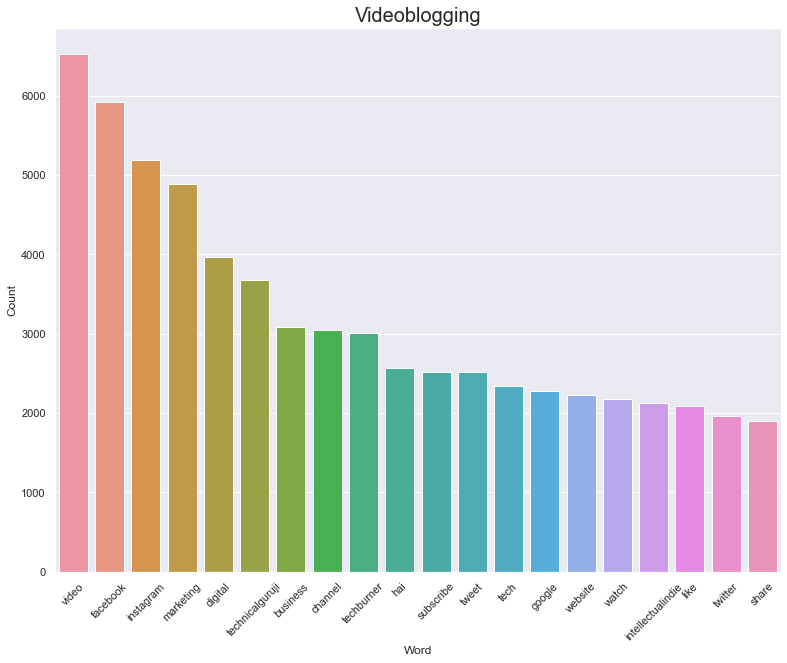

Enter any key to continue


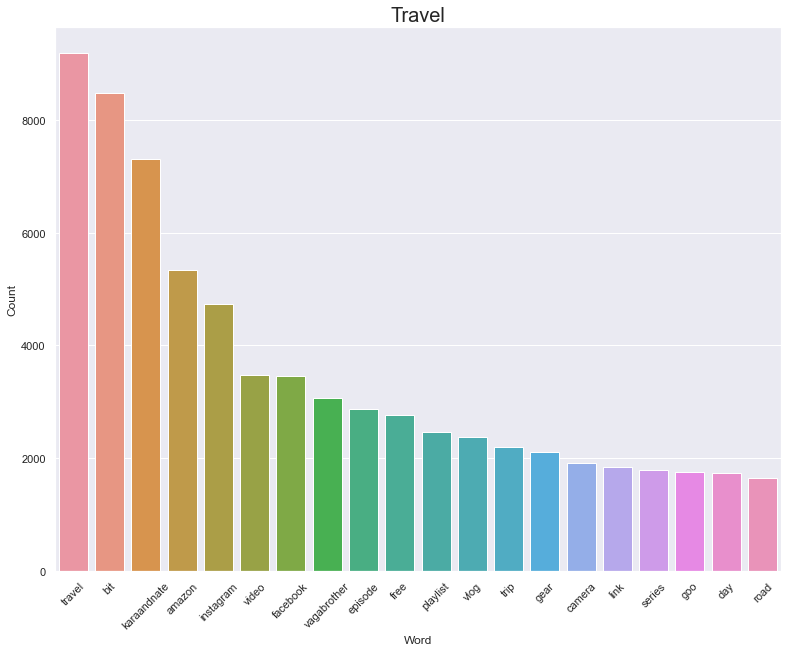

Enter any key to continue


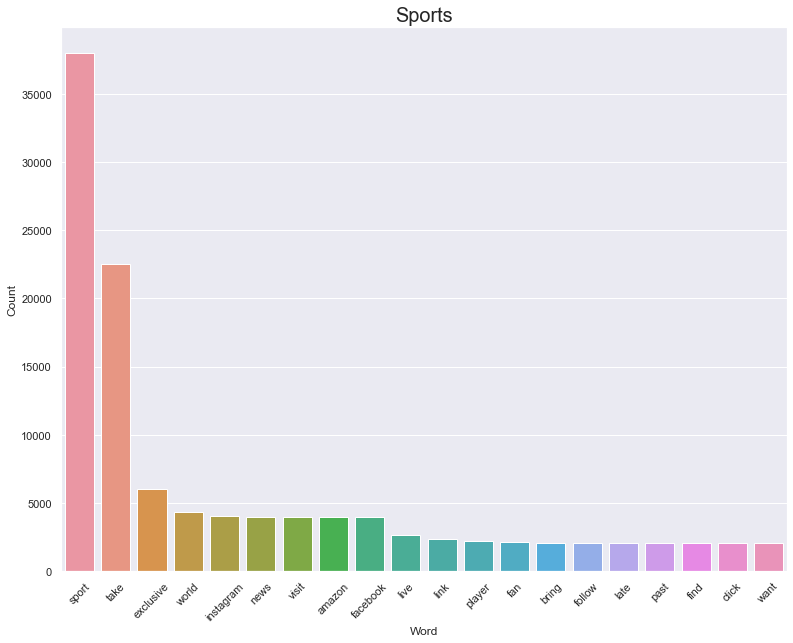

Enter any key to continue


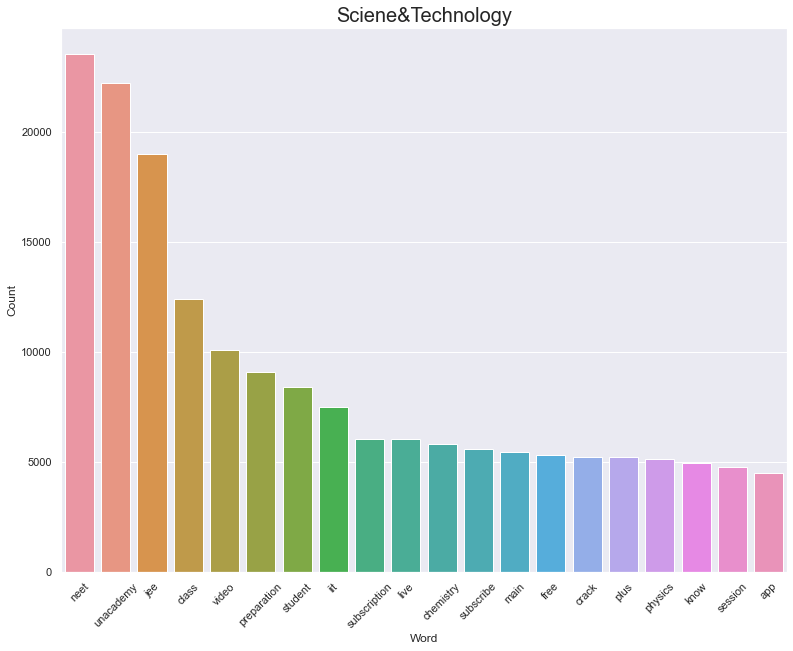

Enter any key to continue


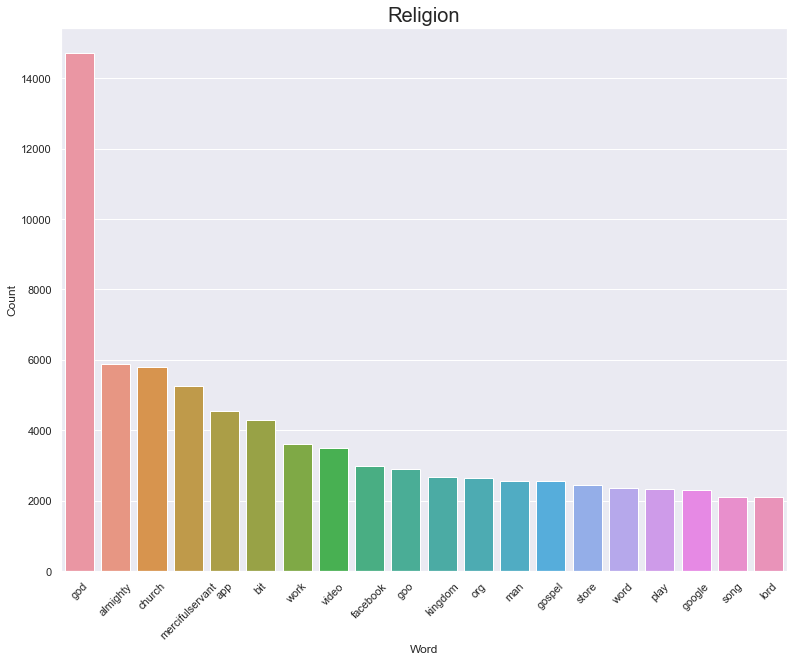

Enter any key to continue


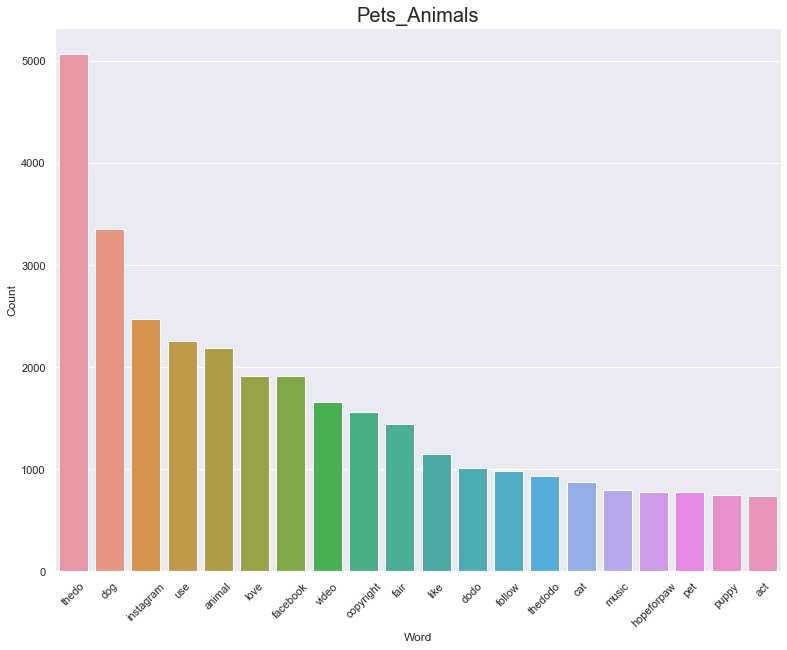

Enter any key to continue


In [13]:
for cat in categories:
    plot_unigram(desc_freq[desc_freq.Category==cat].iloc[:20], cat)
    input("Enter any key to continue")

### Tags

In [14]:
tags_freq = pd.read_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\Tags_countsNEW.csv")

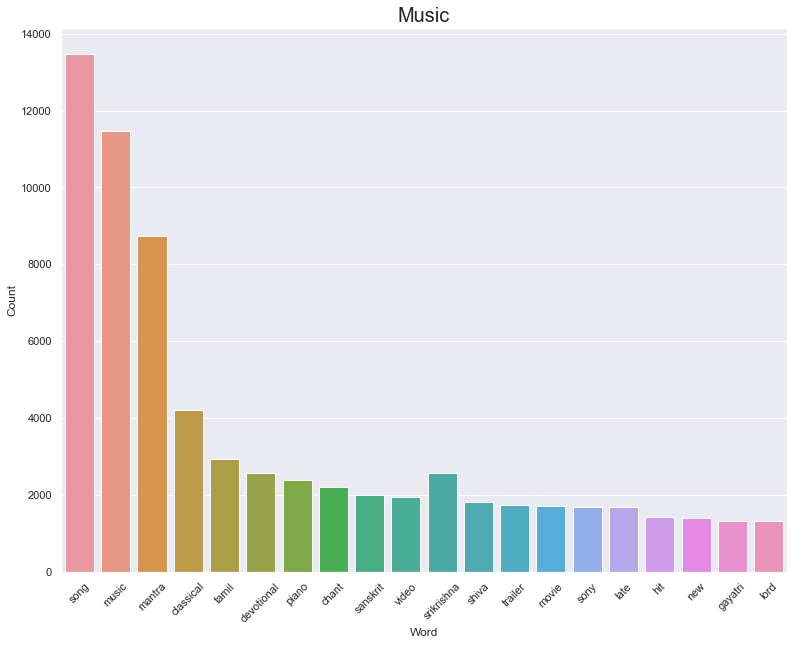

Enter any key to continue


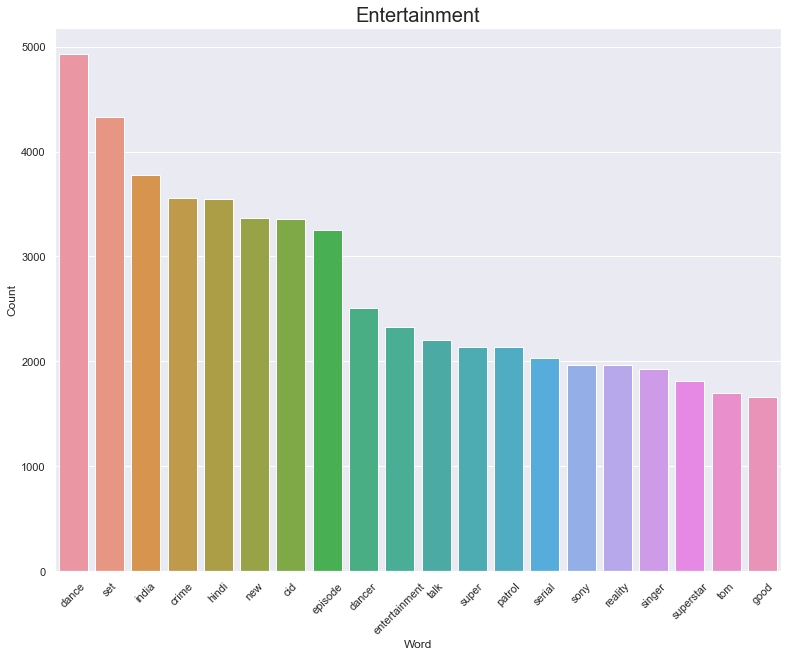

Enter any key to continue


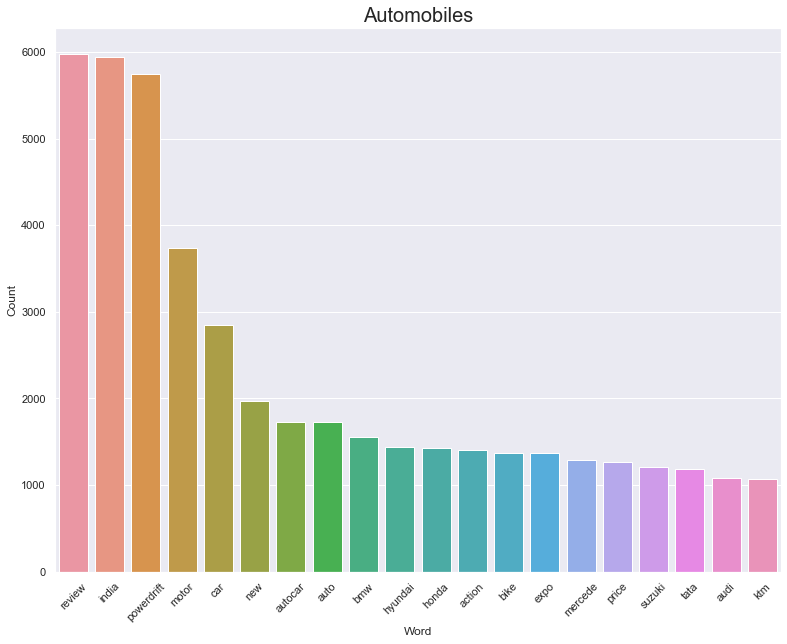

Enter any key to continue


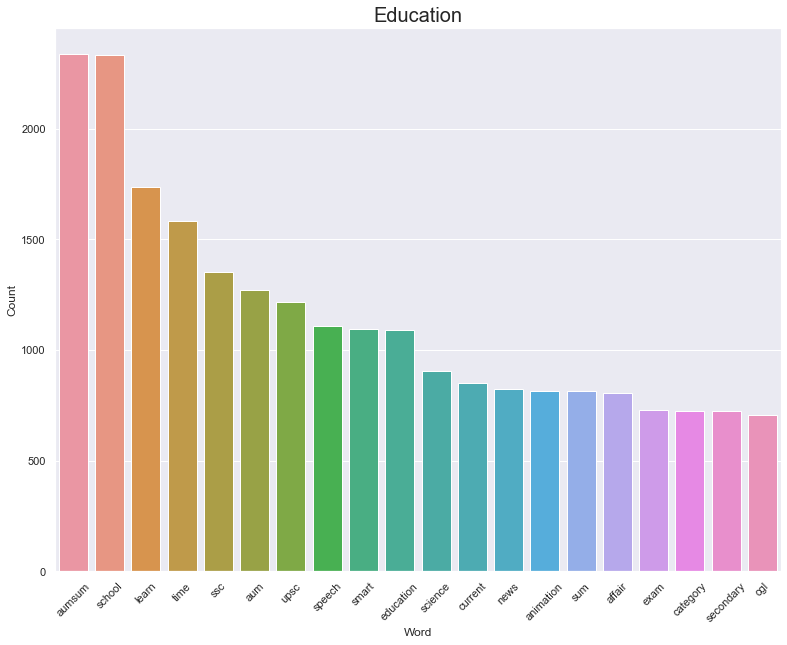

Enter any key to continue


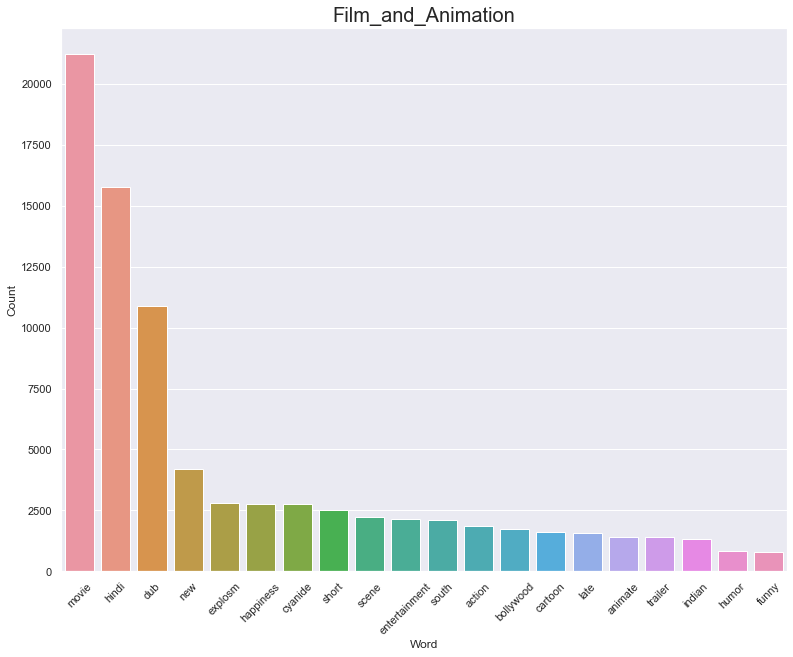

Enter any key to continue


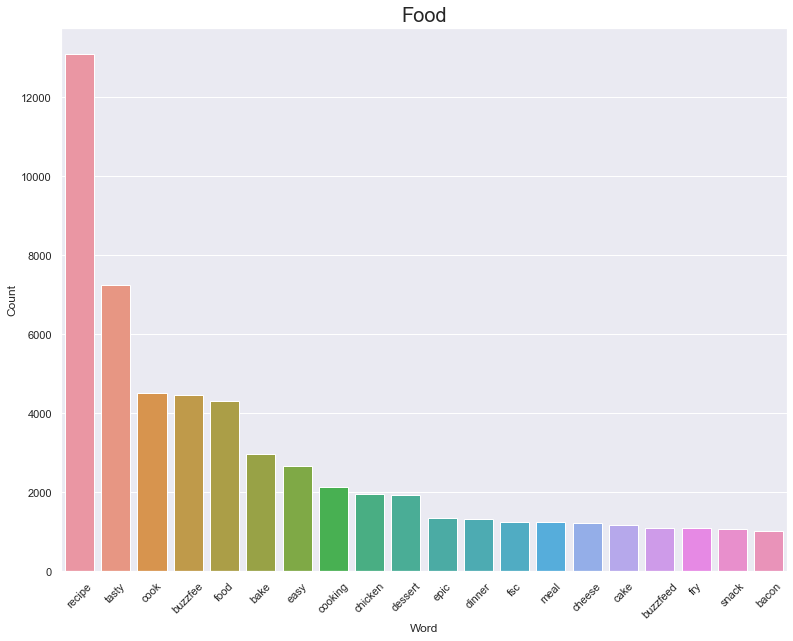

Enter any key to continue


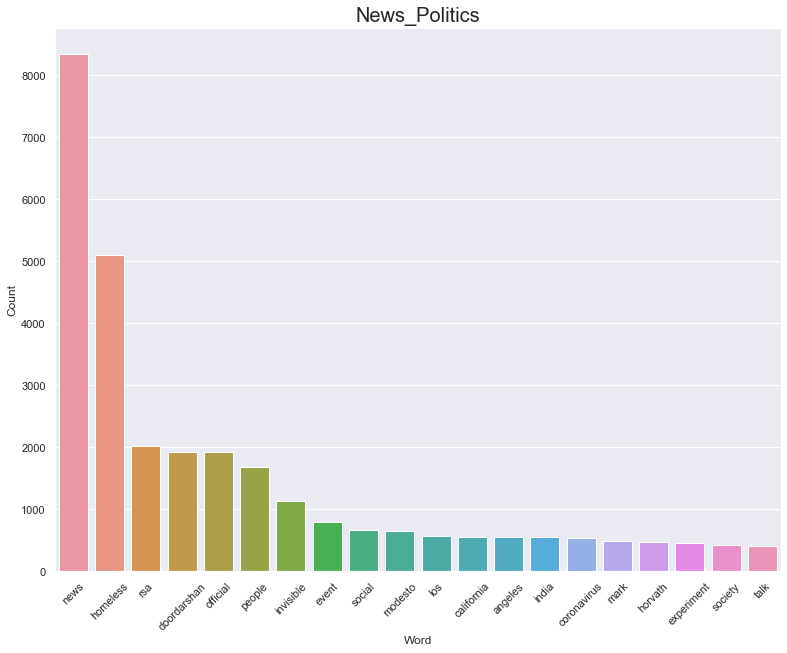

Enter any key to continue


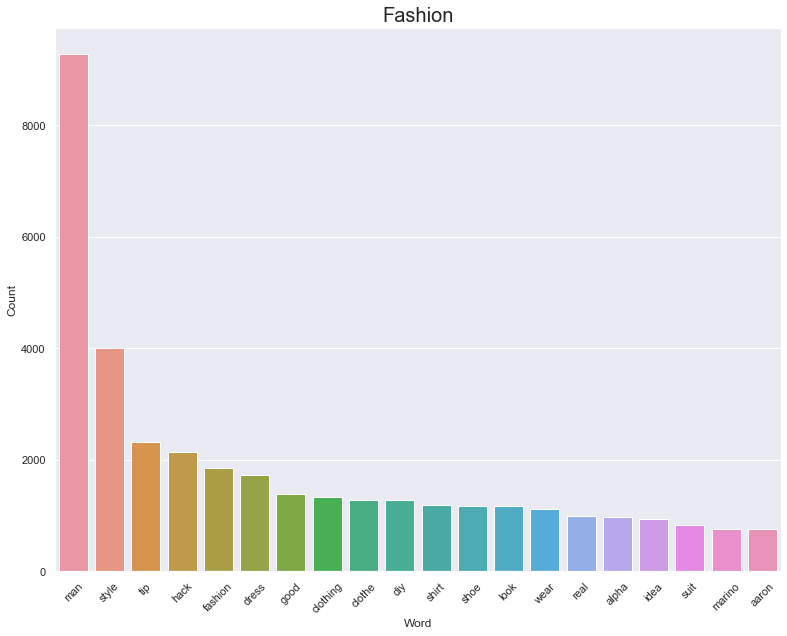

Enter any key to continue


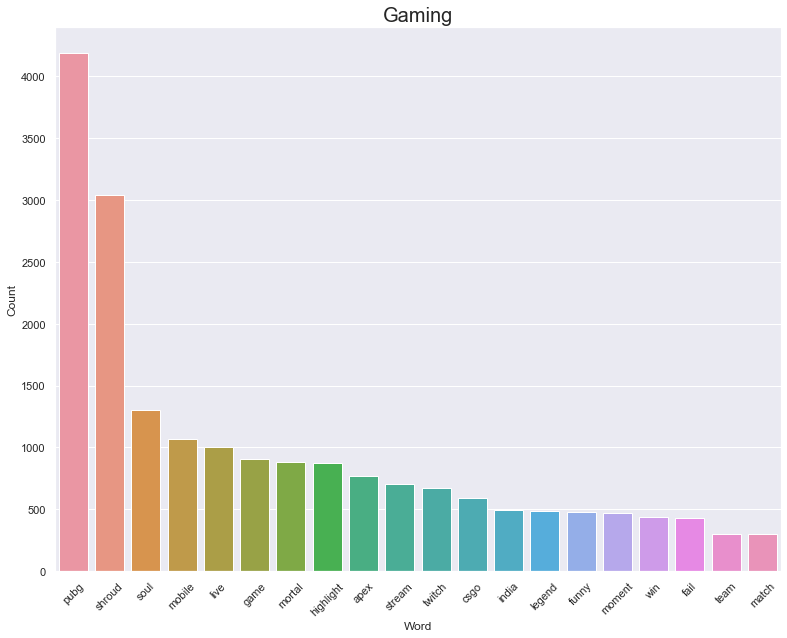

Enter any key to continue


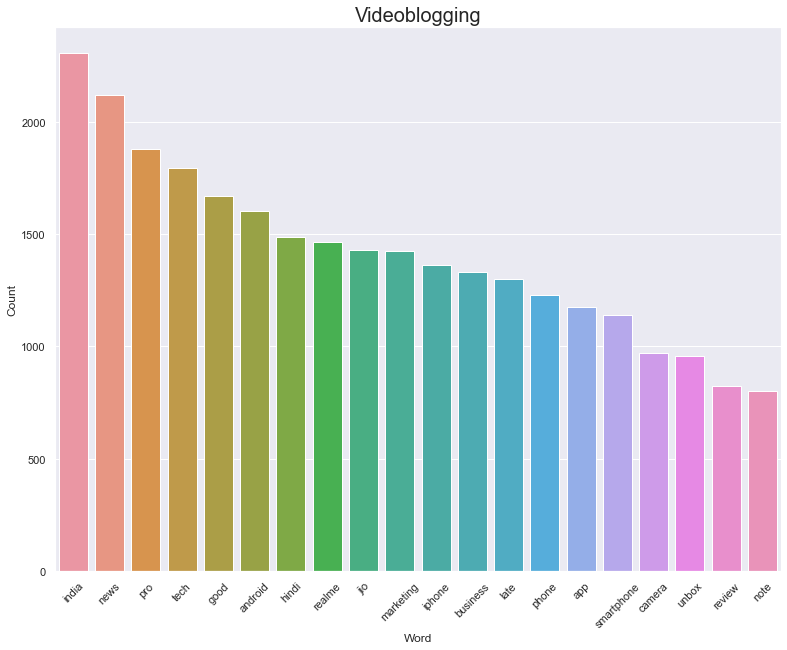

Enter any key to continue


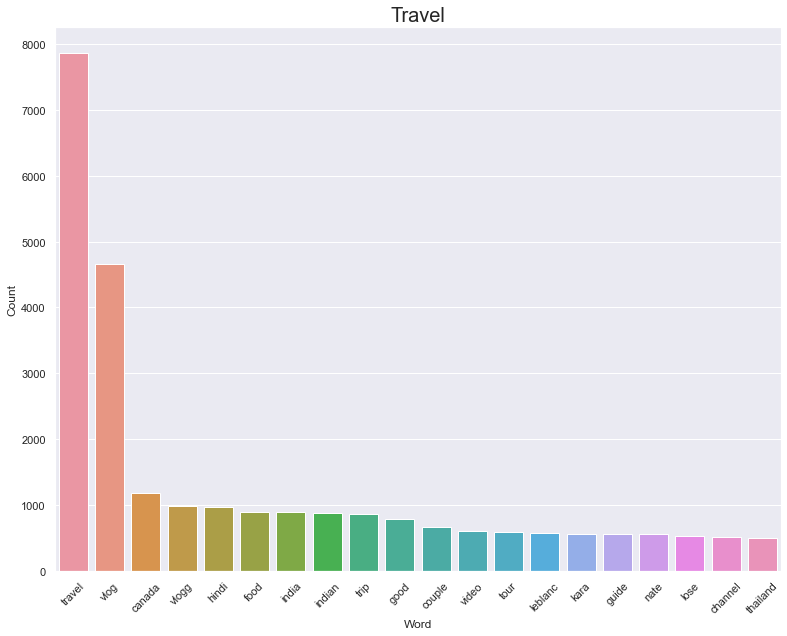

Enter any key to continue


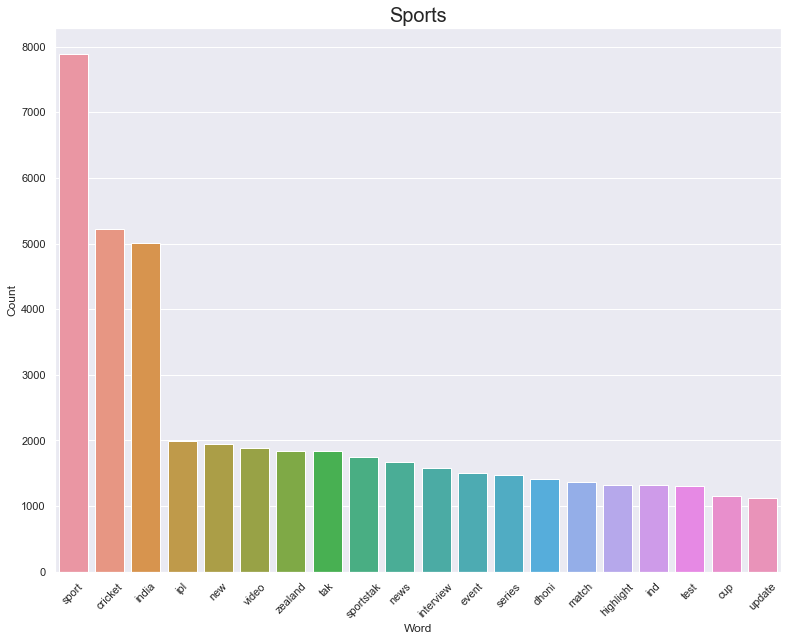

Enter any key to continue


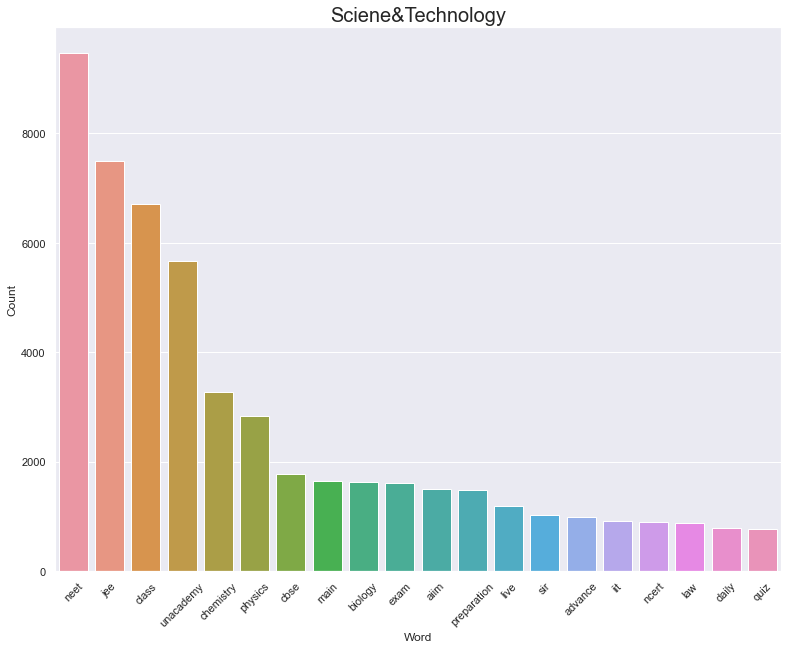

Enter any key to continue


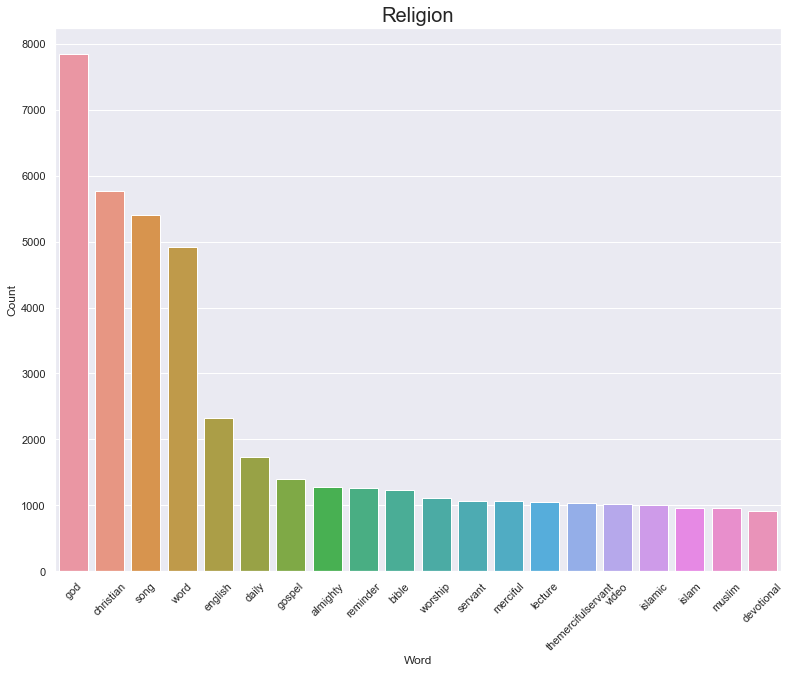

Enter any key to continue


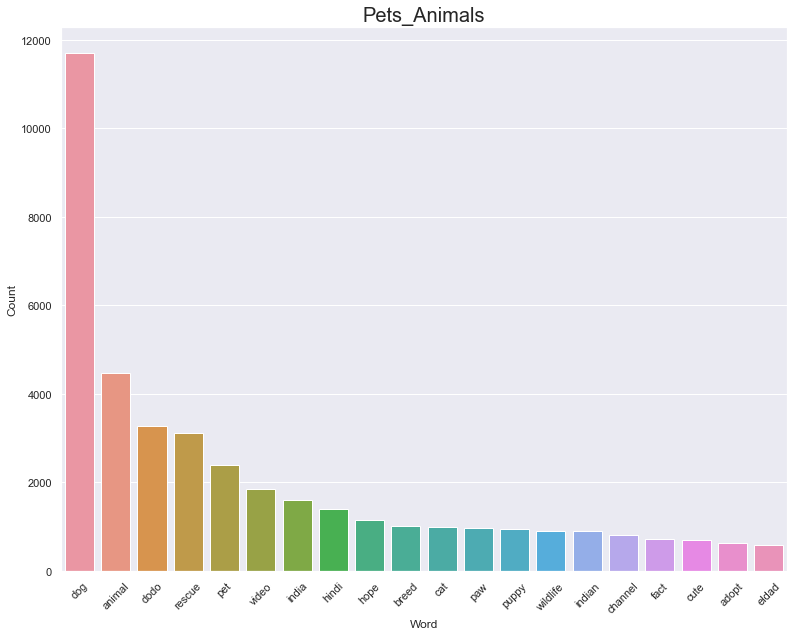

Enter any key to continue


In [15]:
for cat in categories:
    plot_unigram(tags_freq[tags_freq.Category==cat].iloc[:20], cat)
    input("Enter any key to continue")

## Word Cloud

In [16]:
def wordcloud(text, cat):
    wordcloud = WordCloud(
                          background_color='white',
                          max_words=100,
                          max_font_size=50,
                          random_state=42
                         ).generate_from_frequencies(text)
#     print(cat)   
    fig = plt.figure(figsize = (12, 12))    
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(cat, fontsize=30, pad=25, color="white", backgroundcolor="black")
    plt.show()
#     fig.savefig("word1.png", dpi=900)

### Titles

In [17]:
title_freq = pd.read_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\Title_countsNEW.csv")
title_freq.head()

,Category,Word,Count
0,Music,music,1041
1,Music,mantra,916
2,Music,song,863
3,Music,srikrishna,686
4,Music,classical,516


In [18]:
categories = title_freq.Category.unique()
categories

array(['Music', 'Entertainment', 'Automobiles', 'Education',
       'Film_and_Animation', 'Food', 'News_Politics', 'Fashion', 'Gaming',
       'Videoblogging', 'Travel', 'Sports', 'Sciene&Technology',
       'Religion', 'Pets_Animals'], dtype=object)

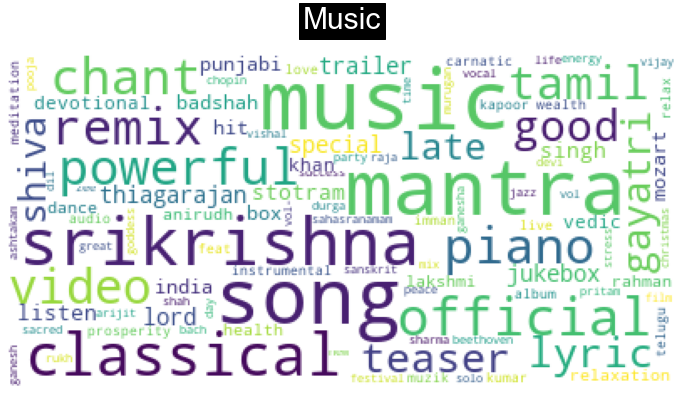

Enter any key to continue


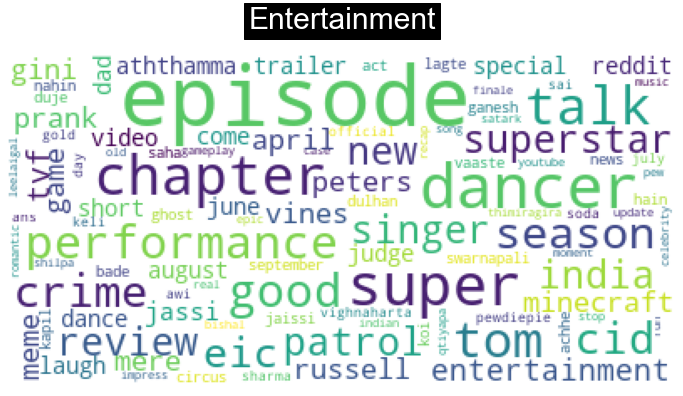

Enter any key to continue


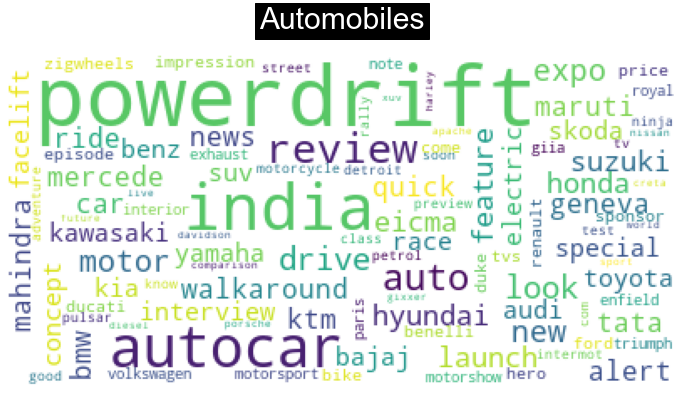

Enter any key to continue


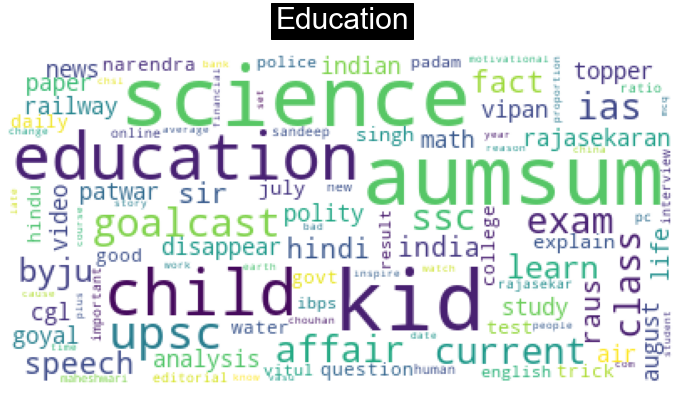

Enter any key to continue


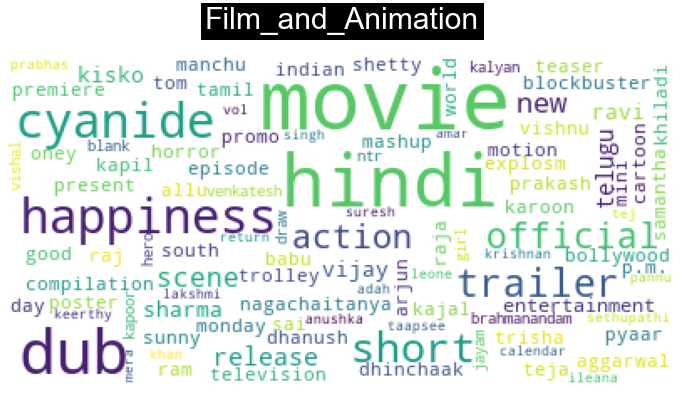

Enter any key to continue


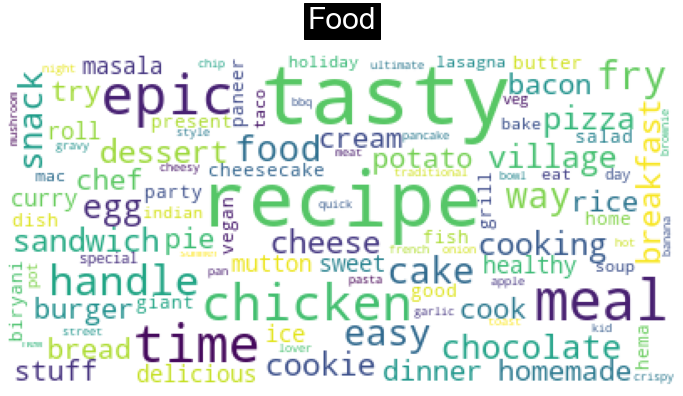

Enter any key to continue


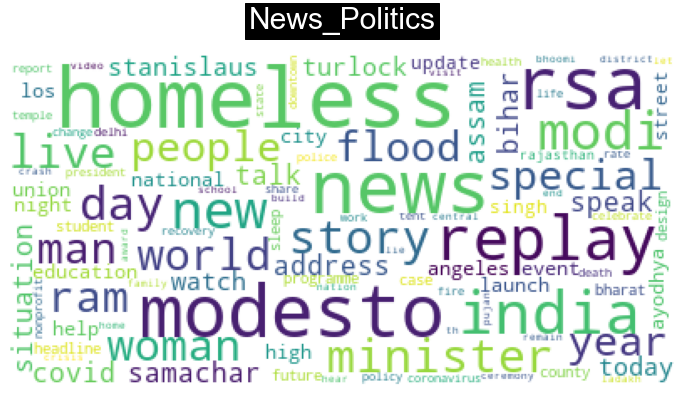

Enter any key to continue


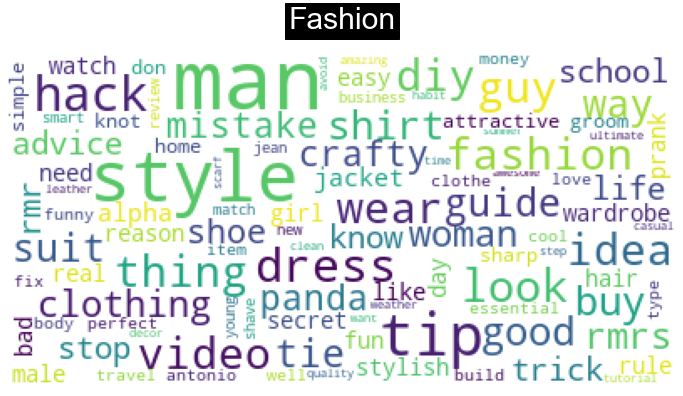

Enter any key to continue


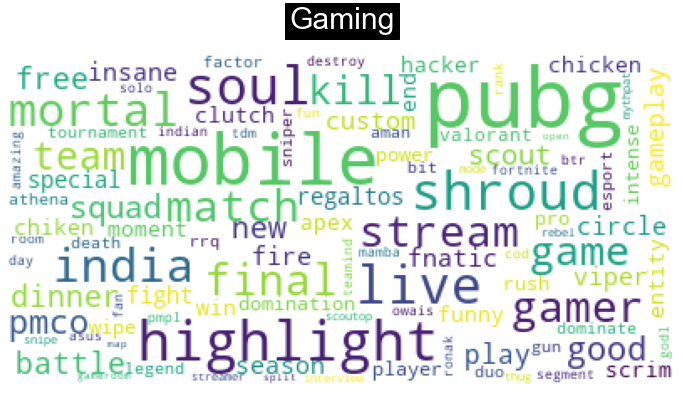

Enter any key to continue


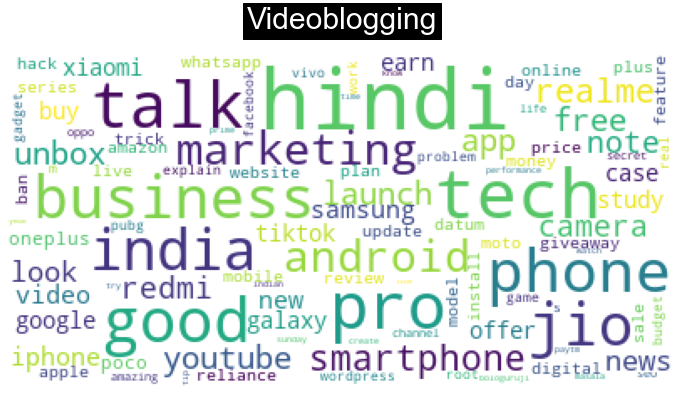

Enter any key to continue


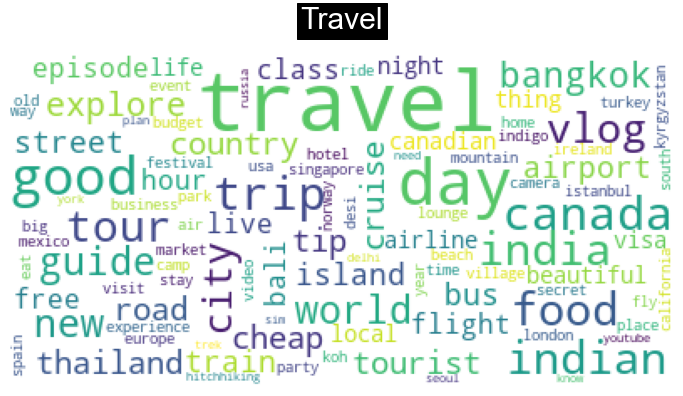

Enter any key to continue


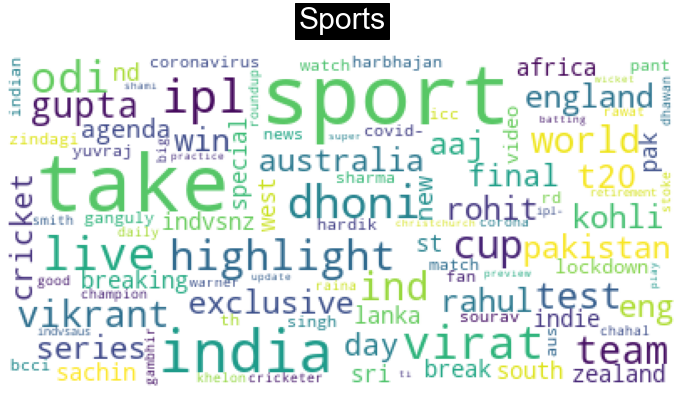

Enter any key to continue


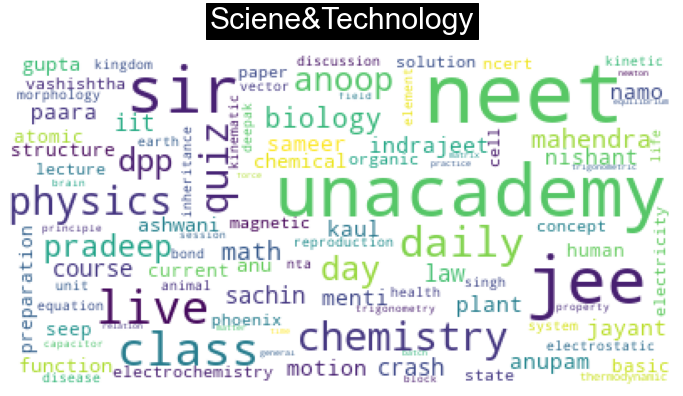

Enter any key to continue


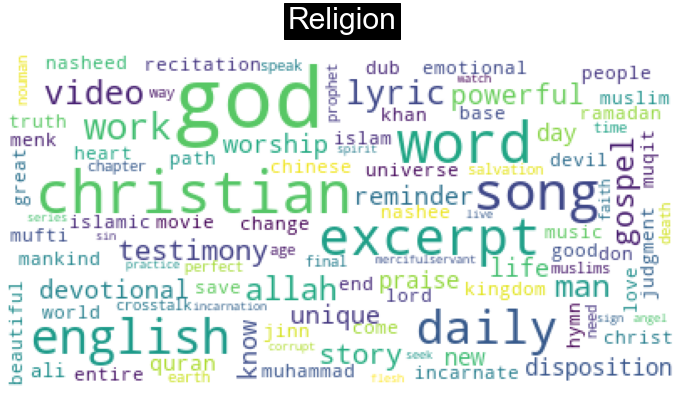

Enter any key to continue


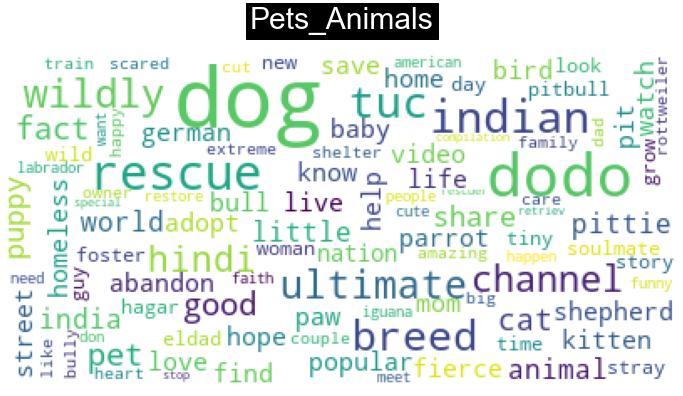

Enter any key to continue


In [29]:
for cat in categories:
#     print(title_freq.Count[title_freq.Category==cat].tolist())
    txt = dict(zip(title_freq.Word[title_freq.Category==cat].tolist(), title_freq.Count[title_freq.Category==cat].tolist()))
#     print(txt)
    wordcloud(txt,cat)
    input("Enter any key to continue")  
#     break
    

### Description

In [22]:
desc_freq = pd.read_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\Desc_countsNEW.csv")
desc_freq.head()

,Category,Word,Count
0,Music,music,20165
1,Music,song,8183
2,Music,facebook,6827
3,Music,bit,6083
4,Music,subscribe,5473


In [23]:
desc_freq.fillna(".", inplace=True)

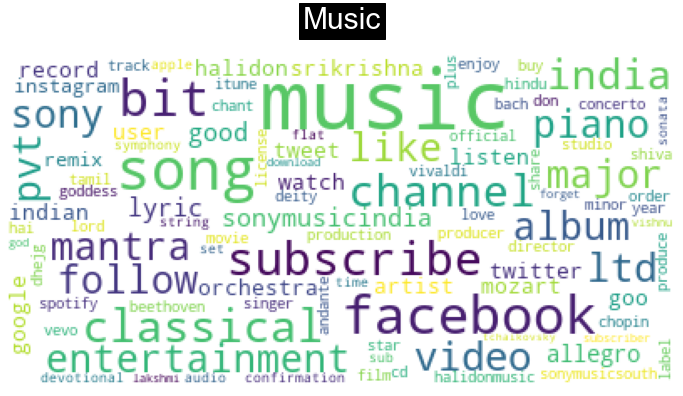

Enter any key to continue


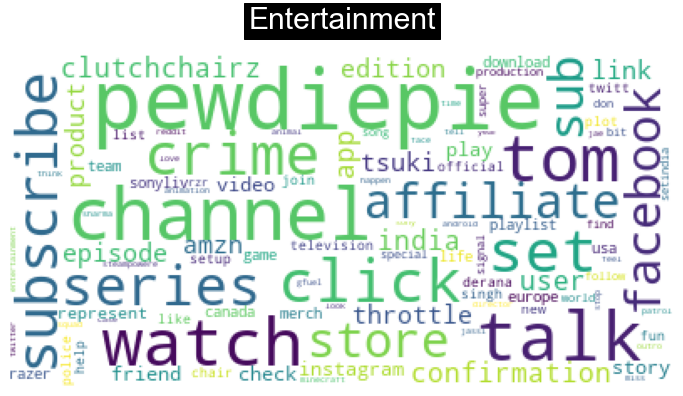

Enter any key to continue


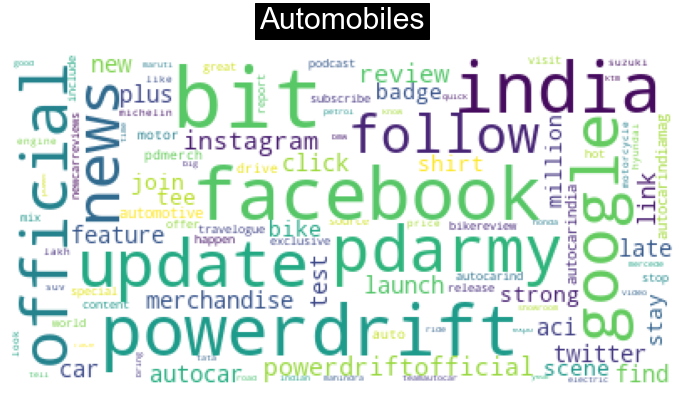

Enter any key to continue


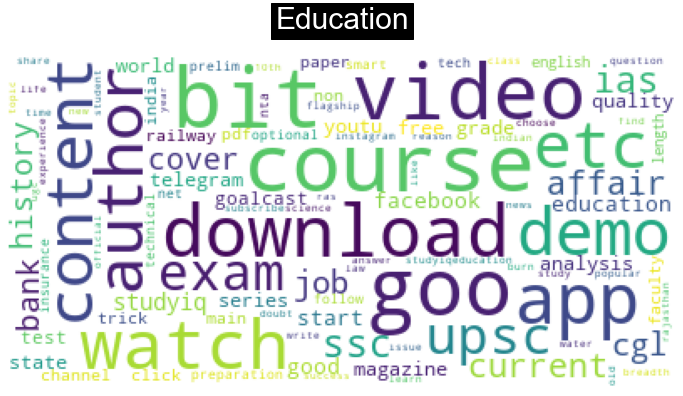

Enter any key to continue


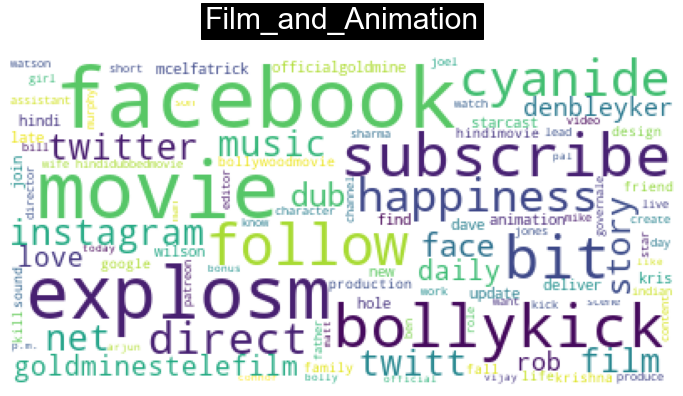

Enter any key to continue


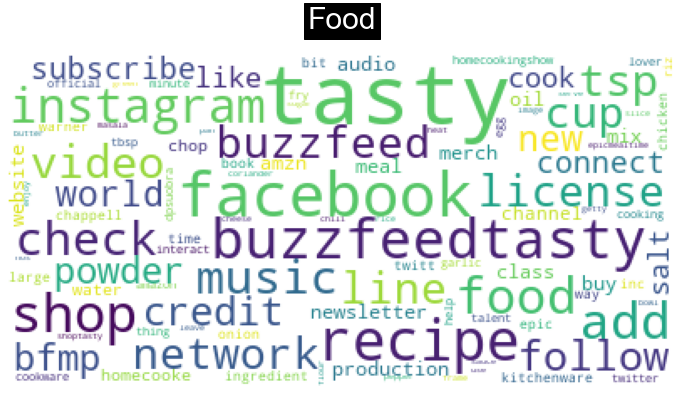

Enter any key to continue


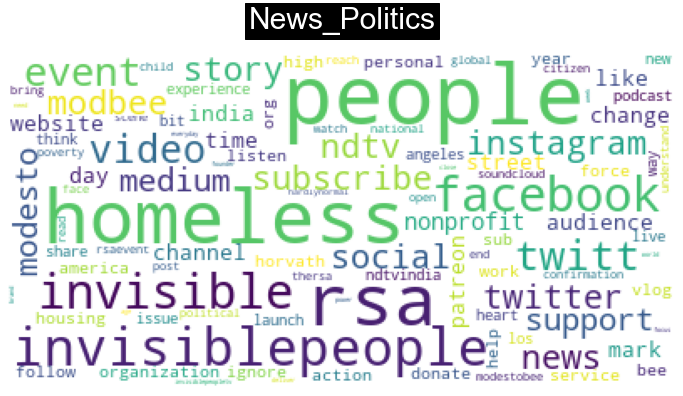

Enter any key to continue


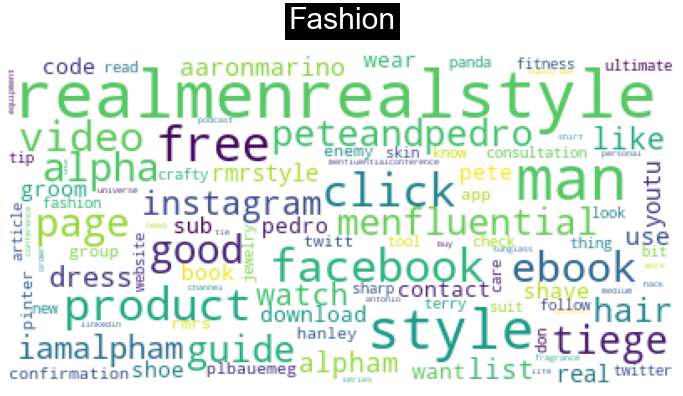

Enter any key to continue


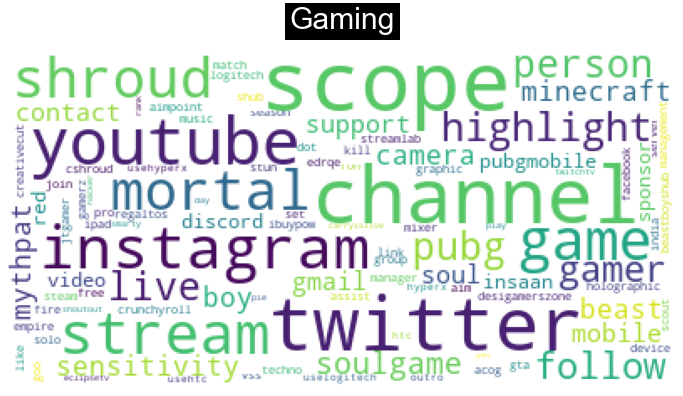

Enter any key to continue


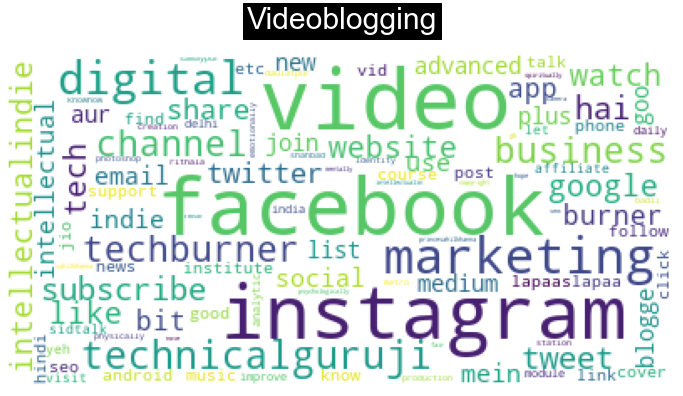

Enter any key to continue


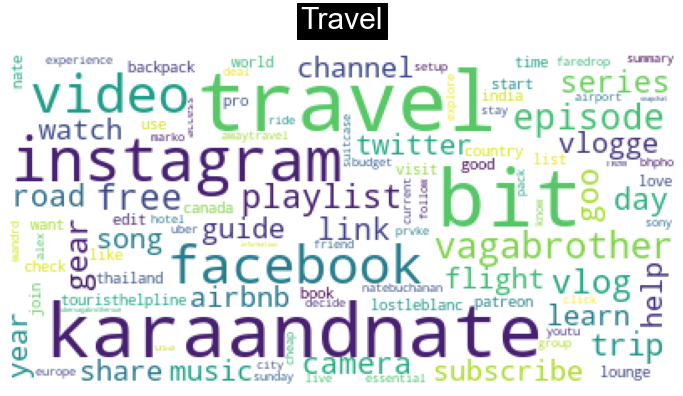

Enter any key to continue


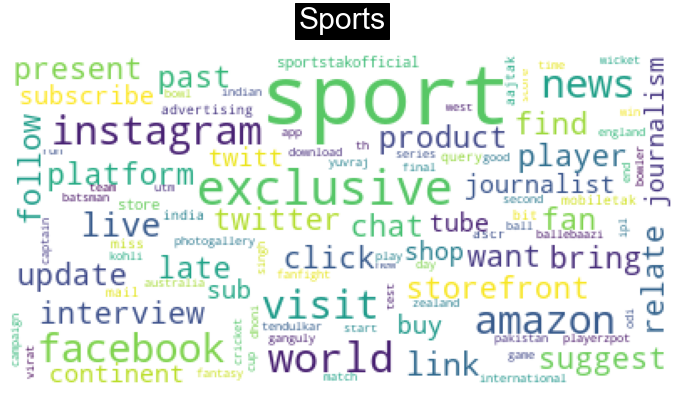

Enter any key to continue


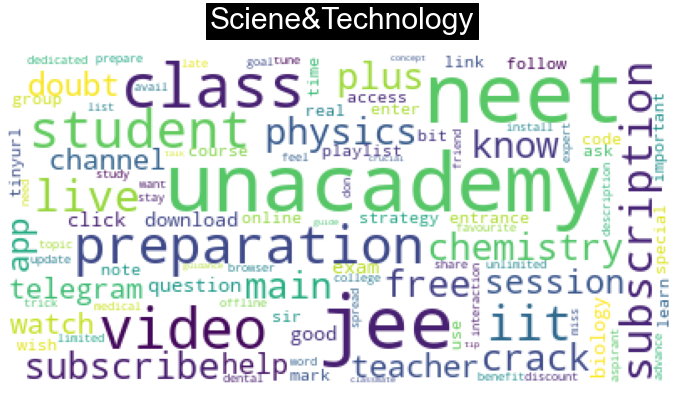

Enter any key to continue


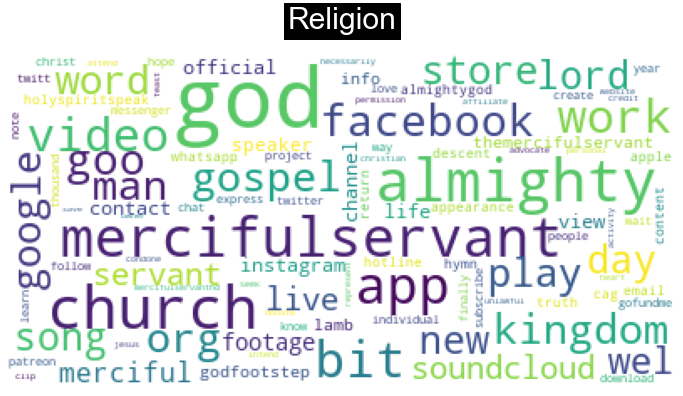

Enter any key to continue


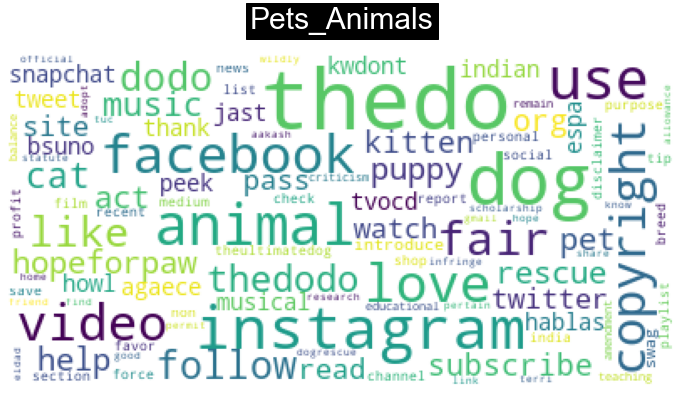

Enter any key to continue


In [24]:
for cat in categories:
#     print(desc_freq.Count[desc_freq.Category==cat].tolist())
    txt = dict(zip(desc_freq.Word[desc_freq.Category==cat].tolist(), desc_freq.Count[desc_freq.Category==cat].tolist()))
#     print(txt)
    wordcloud(txt,cat)
    input("Enter any key to continue")  
#     break

### Tags 

In [25]:
tags_freq = pd.read_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\Tags_countsNEW.csv")

In [26]:
tags_freq.fillna(".", inplace=True)

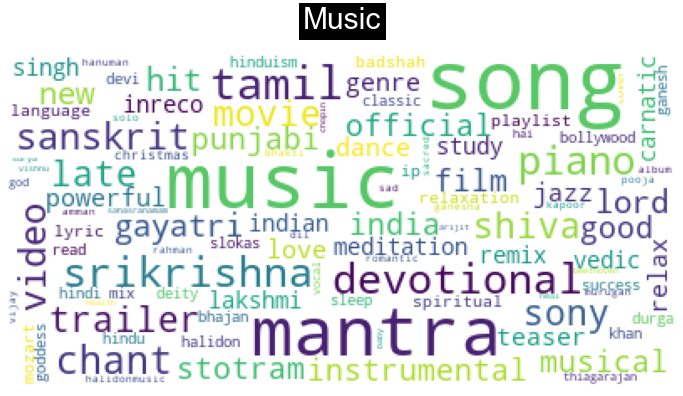

Enter any key to continue


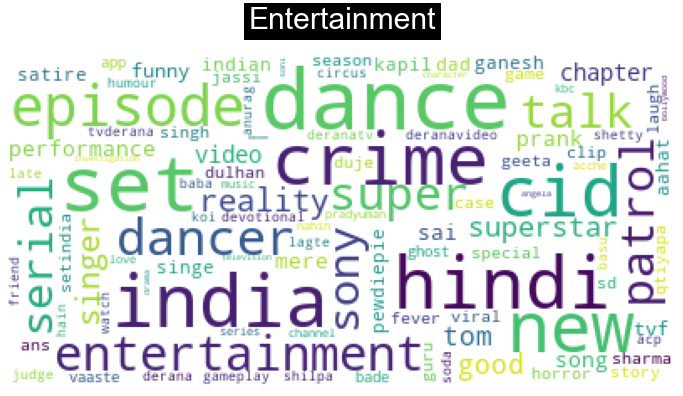

Enter any key to continue


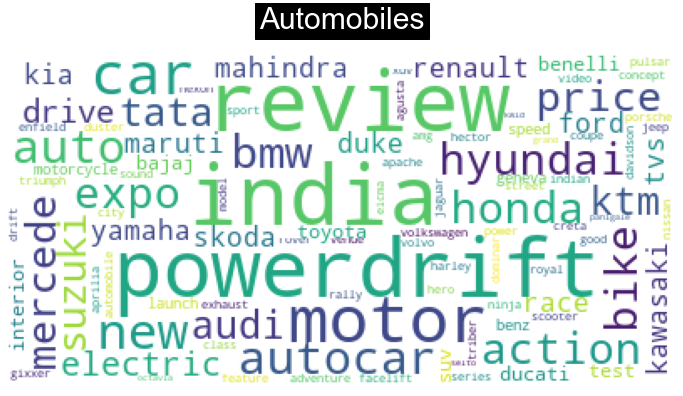

Enter any key to continue


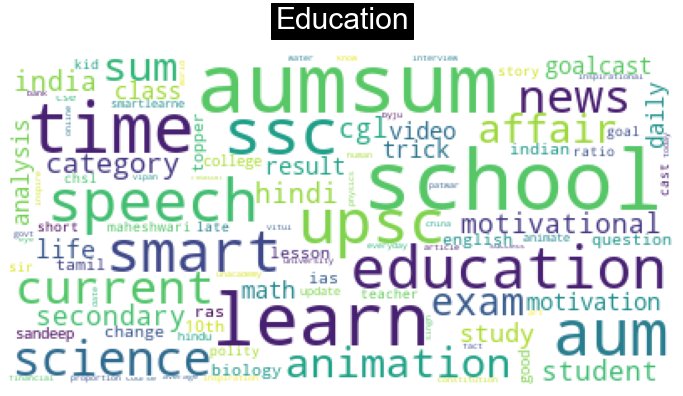

Enter any key to continue


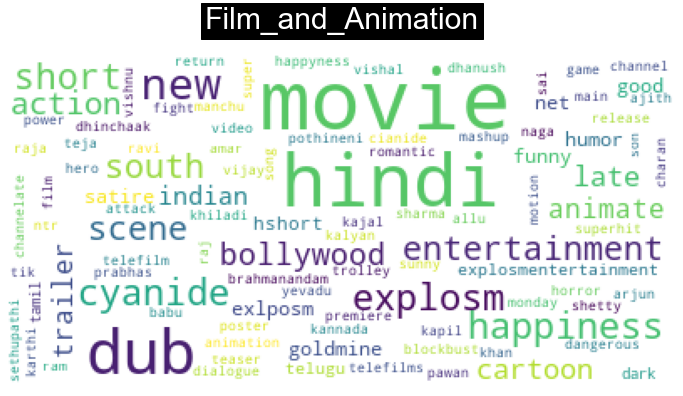

Enter any key to continue


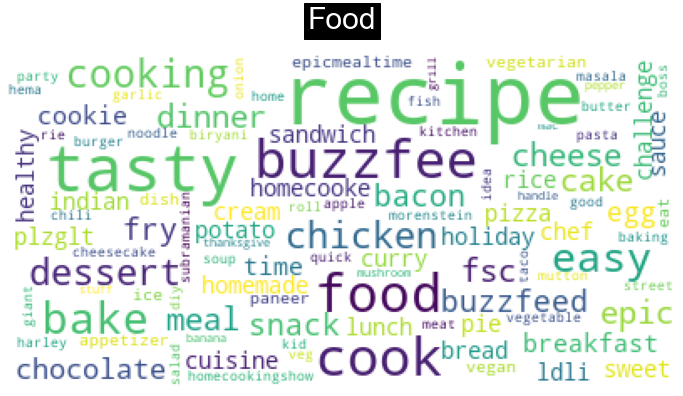

Enter any key to continue


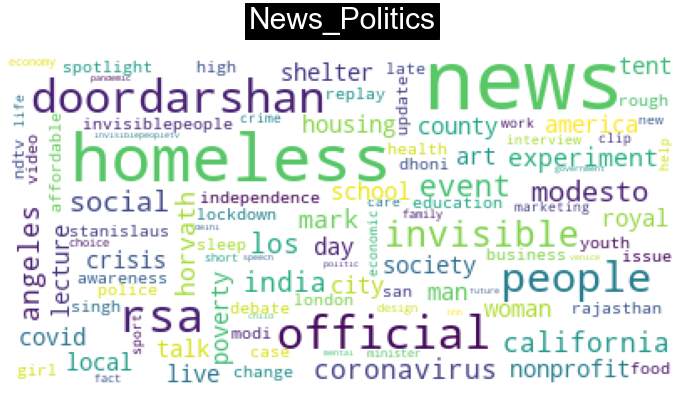

Enter any key to continue


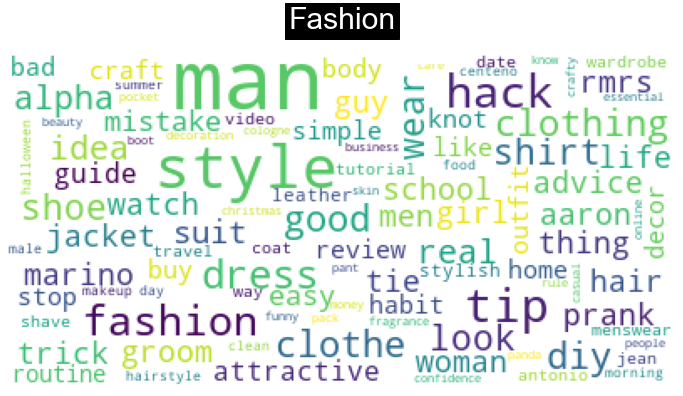

Enter any key to continue


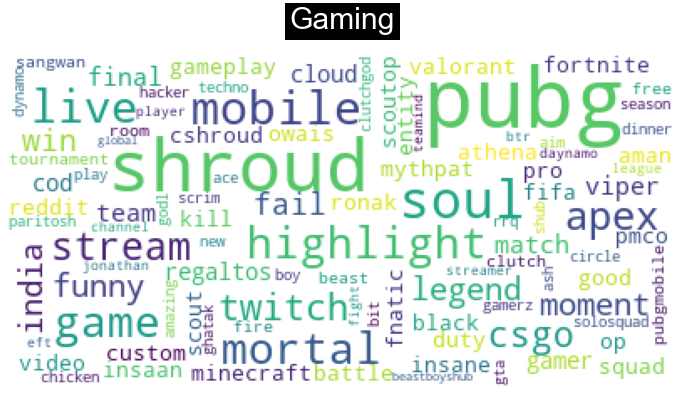

Enter any key to continue


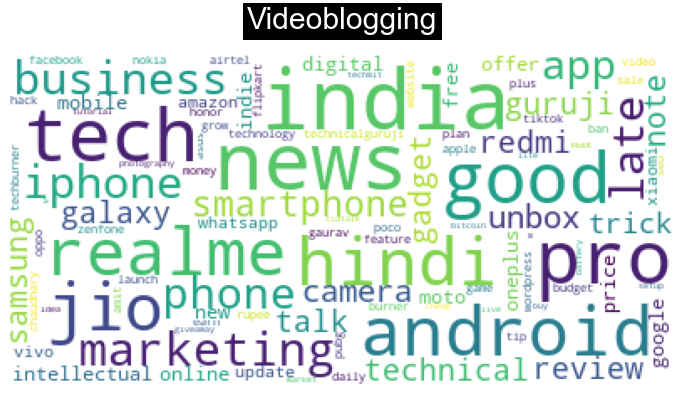

Enter any key to continue


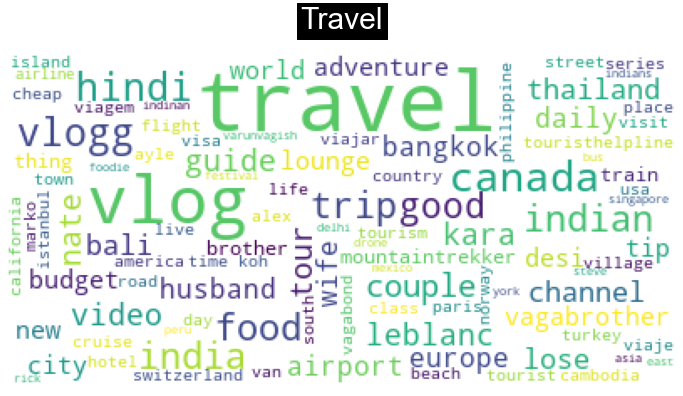

Enter any key to continue


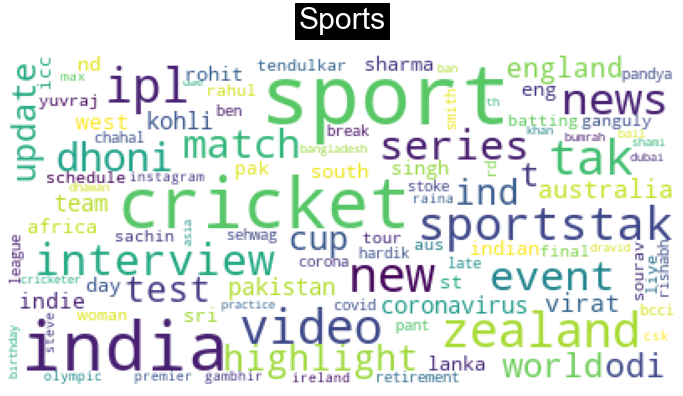

Enter any key to continue


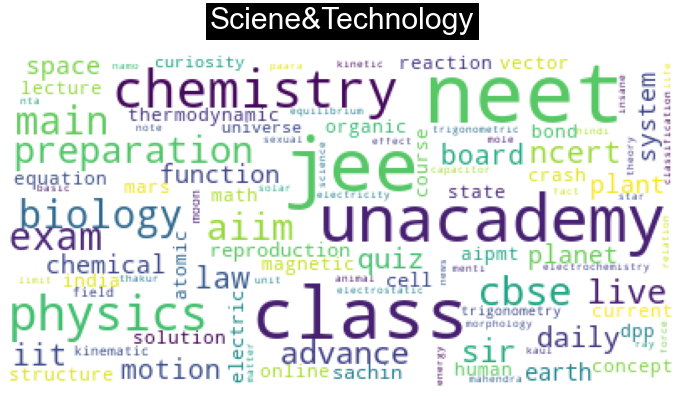

Enter any key to continue


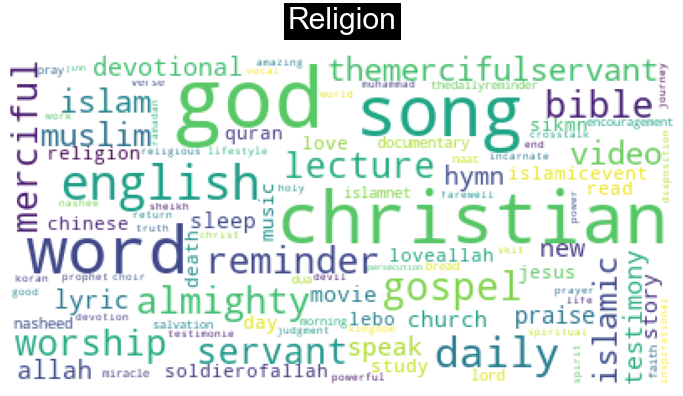

Enter any key to continue


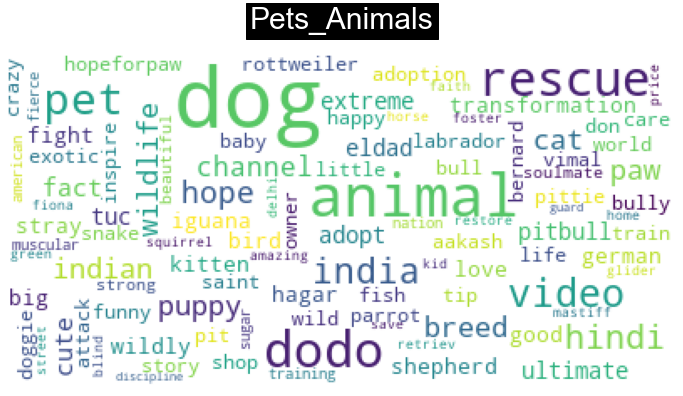

Enter any key to continue


In [27]:
for cat in categories:
#     print(tags_freq.Count[tags_freq.Category==cat].tolist())
    txt = dict(zip(tags_freq.Word[tags_freq.Category==cat].tolist(), tags_freq.Count[tags_freq.Category==cat].tolist()))
#     print(txt)
    wordcloud(txt,cat)
    input("Enter any key to continue")  
#     break

In [ ]:
# wordcloud(title_cloud.Word[title_cloud.Category=="Automobiles"].iloc[0],cat)


## Timestamp

In [ ]:
time_df = pd.read_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Data_with_time.csv")
time_df.head()

In [ ]:
time_df["Title"] = time_df["Title"].astype(str)
time_df["Description"] = time_df["Description"].astype(str)
time_df["Tags"] = time_df["Tags"].astype(str)
time_df["Year"] = time_df["Year"].astype(int, errors="ignore")
time_df["Month"] = time_df["Month"].astype(int, errors="ignore")

In [ ]:
time_df.drop(["URL", "Day", "Time", "Timestamp"], axis=1, inplace=True)

In [ ]:
time_df.shape

In [ ]:
categories = time_df.Category.unique()
categories

In [ ]:
def word_counterYr(text, cat, yr, main_counts):
    freq = pd.Series(' '.join(text).split())
    freq=freq.str.cat(sep=" ")
    docs = nlp(freq)
    tokens = [preprocess_token(token) for token in docs if is_token_allowed(token)]    
    
    word_counts = Counter(tokens)

    counts_df = pd.DataFrame.from_dict(word_counts, orient="index").reset_index()
    counts_df = counts_df.rename(columns={"index":"Word",0:"Count"}).sort_values(by="Count", ascending=False)
#     counts_df["Category"] = cat
#     counts_df["Year"] = yr

    main_counts = main_counts.merge(counts_df, on="Word", how="outer")
#     print(main_counts.head())
    main_counts.fillna(0, inplace=True)
    main_counts["Count"] = main_counts['Count_x'] + main_counts['Count_y']
    main_counts["Category"] = cat
    main_counts["Year"] = yr
    main_counts.drop(["Count_x", "Count_y"], axis=1, inplace=True)
#     print(main_counts.head())
    return main_counts


In [ ]:
# # TitleYear_freq= pd.DataFrame(columns=["Category","Word", "Count", "Year"])
# year_df = pd.DataFrame(columns=["Category", "Year", "Month", "Title", "Description", "Tags"])
# for cat in categories:
# #     if cat=="Sports": continue
# #     midman_df = pd.DataFrame(columns=["Category","Word", "Count", "Year"])
#     cat_df = time_df[time_df.Category==cat] 
#     cat_df["Title"] = cat_df.groupby(['Year', 'Month'])['Title'].transform(lambda x : ' '.join(x))
#     cat_df["Description"] = cat_df.groupby(['Year', 'Month'])['Description'].transform(lambda x : ' '.join(x))
#     cat_df["Tags"] = cat_df.groupby(['Year', 'Month'])['Tags'].transform(lambda x : ' '.join(x))
#     cat_df.drop_duplicates(inplace=True)
#     print(cat_df)
#     clean_df = cleaner(cat_df)
# #     print(clean_df.isna().sum())
#     # time_df = time_df.convert_dtypes()

#     clean_df.sort_values(by='Year', ascending=False, inplace=True)    
# #     clean_df.drop(["Title", "Description", "Tags"], axis=1, inplace=True)
#     year_df = pd.concat([clean_df, year_df], ignore_index=True)
#     year_df.fillna(".", axis=0, inplace=True)
# #     clean_df.drop(["URL","Title", "Description", "Tags", "Timestamp", "Time", "Day"], axis=1, inplace=True)
# #     clean_df.dropna(axis=0,inplace=True)
# #     print(clean_df)
# #     cat_df = cat_df.loc[(cat_df.Year == 2020) | (time_df.Year==2019),]



In [ ]:
time_df.head(10)

In [ ]:
#Basic Cleaning
clean_df = cleaner(time_df[["Title", "Description", "Tags"]])
clean_df.head()

In [ ]:
tokens_df= pd.DataFrame(columns=["Title_token", "Desc_token", "Tags_token", "Category", "Year", "Month"])
tokens_df

In [ ]:
#Tokenization
tokens_df = get_tokens(clean_df, tokens_df )

In [ ]:
tokens_df["Category"]=time_df["Category"]
tokens_df["Year"]=time_df["Year"].astype(int, errors="ignore")
tokens_df["Month"]=time_df["Month"].astype(int, errors="ignore")
tokens_df["Desc_token"] = tokens_df["Desc_token"].str.replace('http\S+|www.\S+|html\S+|-\S+|com\S+|youtube\S+|https\S+','', case=False)
tokens_df["Tags_token"] = tokens_df["Tags_token"].str.replace('http\S+|www.\S+|html\S+|-\S+|com\S+|youtube\S+|https\S+','', case=False)

In [ ]:
tokens_df.head()

In [ ]:
tokens_df.to_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\tokens_time.csv", index=False)

### Titles

In [ ]:
TitleYear_freq= pd.DataFrame(columns=["Category","Word", "Count", "Year"])

for cat in categories:
#     midman_df = pd.DataFrame(columns=["Category","Word", "Count", "Year"])
    cat_df = tokens_df[tokens_df.Category==cat]
    years = [2019,2020]
    if cat=="Sports": years=[2020]
    for year in years:
        midman_df = pd.DataFrame(columns=["Category","Word", "Count", "Year"])
        midman_df = word_counterYr(text=cat_df.Title_token[cat_df.Year==year], cat=cat, yr=year, main_counts=midman_df)
        midman_df.sort_values(by='Count', ascending=False, inplace=True)
        TitleYear_freq = TitleYear_freq.append(midman_df, ignore_index=True)
    

In [ ]:
TitleYear_freq.head(10)

In [ ]:
TitleYear_freq.to_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\TitleYear_counts.csv", index=False)

In [ ]:
TitleYear_freq = pd.read_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\TitleYear_countsNEW.csv")

In [ ]:
TitleYear_freq.head(10)

### Description

In [ ]:
DescYear_freq= pd.DataFrame(columns=["Category","Word", "Count", "Year"])

for cat in categories:
#     midman_df = pd.DataFrame(columns=["Category","Word", "Count", "Year"])
    cat_df = tokens_df[tokens_df.Category==cat]
    years = [2019,2020]
    if cat=="Sports": years=[2020]
    for year in years:
        midman_df = pd.DataFrame(columns=["Category","Word", "Count", "Year"])
        year_df = cat_df[cat_df.Year==year]
        for i in range(0,year_df.shape[0],200):
            if (i+200)<year_df.shape[0]:l=i+200
            else: l = year_df.shape[0]+1            
            midman_df = word_counterYr(year_df.Desc_token[i:l], cat, year, midman_df)
#             break
#             print(midman_df)
        midman_df.sort_values(by='Count', ascending=False, inplace=True)
        DescYear_freq = DescYear_freq.append(midman_df, ignore_index=True)

In [ ]:
DescYear_freq.to_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\DescYear_counts.csv", index=False)

In [ ]:
DescYear_freq.head(10)

### Tags

In [ ]:
TagsYear_freq= pd.DataFrame(columns=["Category","Word", "Count", "Year"])

for cat in categories:
#     midman_df = pd.DataFrame(columns=["Category","Word", "Count", "Year"])
    cat_df = tokens_df[tokens_df.Category==cat]
    years = [2019,2020]
    if cat=="Sports": years=[2020]
    for year in years:
        midman_df = pd.DataFrame(columns=["Category","Word", "Count", "Year"])
        year_df = cat_df[cat_df.Year==year]
        for i in range(0,year_df.shape[0],200):
            if (i+200)<year_df.shape[0]:l=i+200
            else: l = year_df.shape[0]+1            
            midman_df = word_counterYr(year_df.Tags_token[i:l], cat, year, midman_df)
#             break
#             print(midman_df)
        midman_df.sort_values(by='Count', ascending=False, inplace=True)
        TagsYear_freq = TagsYear_freq.append(midman_df, ignore_index=True)

In [ ]:
TagsYear_freq.to_csv("C:\\Users\\jyoth\\Desktop\\Sem 3\\Youtube MOM proj\\Data\\Word_counts\\TagsYear_counts.csv", index=False)

In [ ]:
TagsYear_freq.head(10)